# <center> **ASSIGNMENT**-2 (ADS)


####Total questions: 10
####Total Points: 100

In [1]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


### **In this assignment you will be tested on Advanced Image Processing, Data Analysis and Machine Learning (CNN).**

In [2]:
# mandatory
Your_name: "Vaibhav Nageshwar Wagh"
Your_email_id: "vaibhavw252@gmail.com"

## GUIDELINES:
- The notebook should be well documented and structured!
- All the images should be called here via urllib (whenever necessary).
- Make sure that none of the code cell should run into any error.
- If we click on ```Run all```, the notebook should run without any errors!


**IF ANY OF THE ABOVE GUIDELINES ARE NOT FOLLOWED THEN YOUR ASSIGNMENT SHALL NOT BE GRADED**

# Q1 (10 Points)

- Use [this image](https://cdn.spacetelescope.org/archives/images/wallpaper4/potw2049a.jpg) and apply the "**Image Denoising using Median Filter**" on it.
- Show the original and output images in parallel using matplotlib subplots.


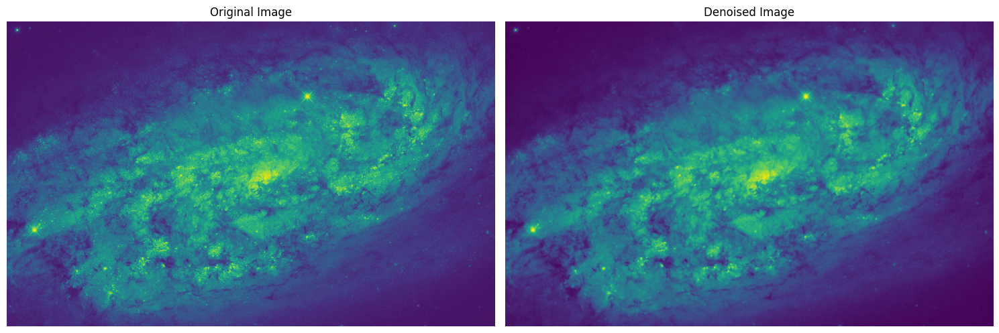

In [3]:
# write your solution here
# import nescessary libray
import cv2
import numpy as np
from skimage import io
import matplotlib.pyplot as plt
import urllib.request

# downloading image
url = 'https://cdn.spacetelescope.org/archives/images/wallpaper4/potw2049a.jpg'
filename = 'image1.jpg'
urllib.request.urlretrieve(url, filename)


# Load the image
image_path = '/content/image1.jpg'
image = cv2.imread(image_path,0)

# Apply median filter
kernel_size = 5  # Adjust the kernel size as needed
denoised_image = cv2.medianBlur(image, kernel_size)

# Display the original and denoised images using subplots
fig, axes = plt.subplots(1, 2, figsize=(15, 15))
#axes[0].imshow(cv2.cvtColor(image, cv2.COLOR_BGR2RGB))
axes[0].imshow(image)
axes[0].set_title('Original Image')
axes[0].axis('off')
axes[1].imshow(denoised_image)
axes[1].set_title('Denoised Image')
axes[1].axis('off')

plt.tight_layout()
plt.show()



# Q2 (10 Points)

- Create a function for Bilateral filter using numpy from scratch and implement it on an image.
- Find below the information and the formula for Bilateral filter.

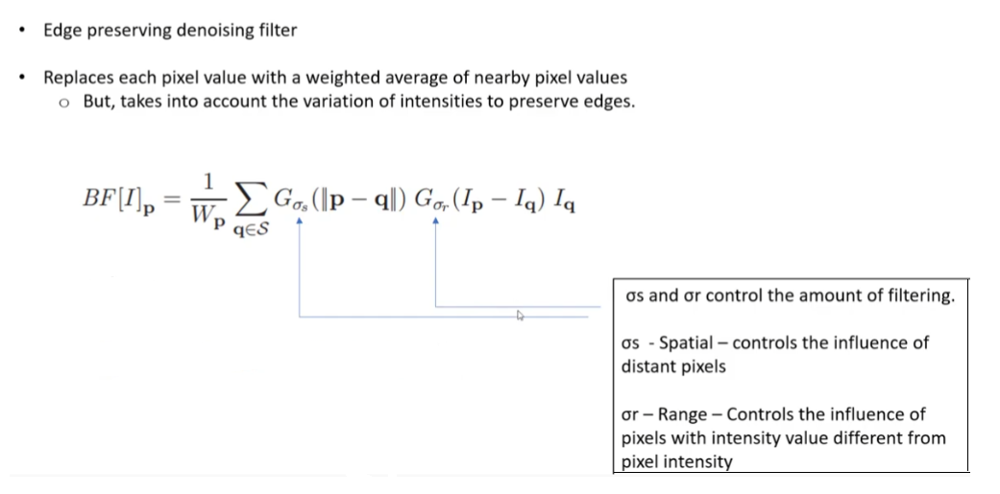

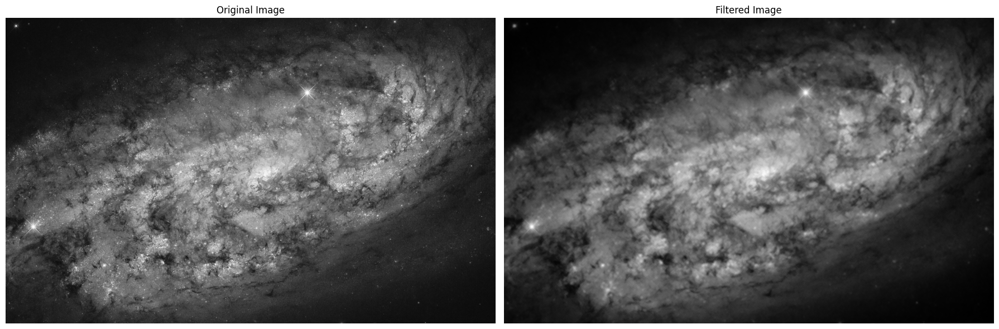

In [4]:
# write your asnwer here
import cv2
import numpy as np
import urllib.request

url = 'https://cdn.spacetelescope.org/archives/images/wallpaper4/potw2049a.jpg'
filename = 'image2.jpg'
urllib.request.urlretrieve(url, filename)


def bilateral_filter(image, d, sigma_color, sigma_space):
    # Create a Gaussian kernel for spatial filtering
    size = 2 * d + 1
    kernel_space = np.zeros((size, size), dtype=np.float32)
    for i in range(size):
        for j in range(size):
            dist = np.sqrt((i - d) ** 2 + (j - d) ** 2)
            kernel_space[i, j] = np.exp(-0.5 * (dist ** 2) / (sigma_space ** 2))

    # Apply bilateral filtering
    filtered_image = np.zeros_like(image, dtype=np.float32)
    padded_image = np.pad(image, ((d, d), (d, d)), mode='symmetric')

    height, width = image.shape
    for i in range(height):
        for j in range(width):
            patch = padded_image[i:i + size, j:j + size]
            kernel_color = np.exp(-0.5 * ((patch - image[i, j]) ** 2) / (sigma_color ** 2))
            kernel = kernel_space * kernel_color
            normalized_kernel = kernel / np.sum(kernel)
            filtered_image[i, j] = np.sum(patch * normalized_kernel)

    return filtered_image.astype(np.uint8)


# Load the image
image_path = '/content/image2.jpg'
image = cv2.imread(image_path, cv2.IMREAD_GRAYSCALE)

# Apply Bilateral filter
d = 5  # Diameter of the pixel neighborhood
sigma_color = 5  # Standard deviation of color space
sigma_space = 10  # Standard deviation of spatial space
filtered_image = bilateral_filter(image, d, sigma_color, sigma_space)


# Display the original and filtered images using matplotlib
fig, axes = plt.subplots(1, 2, figsize=(18, 8))
axes[0].imshow(image, cmap='gray')
axes[0].set_title('Original Image')
axes[0].axis('off')
axes[1].imshow(filtered_image, cmap='gray')
axes[1].set_title('Filtered Image')
axes[1].axis('off')
plt.tight_layout()
plt.show()


# Q3 (15 Points)

Apply below operations on [this image](https://cdn.spacetelescope.org/archives/images/wallpaper4/opo0511a.jpg):

- Apply Block Machine & 3D filtering using any suitable arguments.
- On the output image from Step 1, apply meijering, sato, frangi and hessian filters using skimage package.
- Show all the images in parallel using matplotlib subplots.

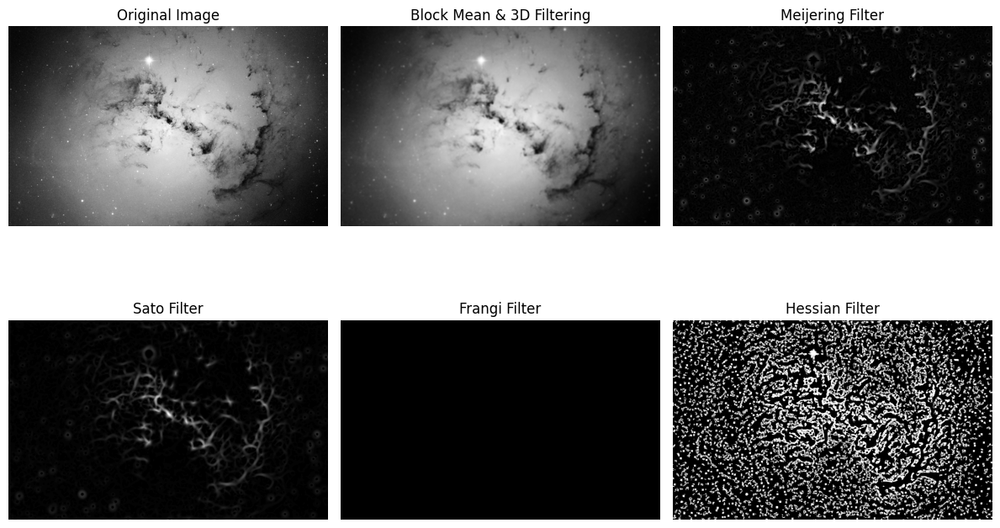

In [5]:
# write you answer here
import cv2
import numpy as np
import matplotlib.pyplot as plt
from skimage import filters
from skimage.filters import meijering, sato, frangi, hessian
from skimage.util import img_as_ubyte
from skimage.morphology import disk
import urllib.request

url = 'https://cdn.spacetelescope.org/archives/images/wallpaper4/opo0511a.jpg'
filename = 'image3.jpg'
urllib.request.urlretrieve(url, filename)



# Load the image
image_path = '/content/image3.jpg'
image = cv2.imread(image_path, 0)

# Apply Block Mean & 3D filtering
block_mean_image = cv2.blur(image, (11, 11))

# Apply Meijering, Sato, Frangi, and Hessian filters
meijering_image = meijering(block_mean_image)
sato_image = sato(block_mean_image)
frangi_image = frangi(block_mean_image)
hessian_image = hessian(block_mean_image)

# Convert the images to uint8 for matplotlib visualization
block_mean_image = img_as_ubyte(block_mean_image)
meijering_image = img_as_ubyte(meijering_image)
sato_image = img_as_ubyte(sato_image)
frangi_image = img_as_ubyte(frangi_image)
hessian_image = img_as_ubyte(hessian_image)

# Plot the images in parallel using subplots
fig, axes = plt.subplots(2, 3, figsize=(12, 8))

axes[0, 0].imshow(image, cmap='gray')
axes[0, 0].set_title('Original Image')
axes[0, 0].axis('off')

axes[0, 1].imshow(block_mean_image, cmap='gray')
axes[0, 1].set_title('Block Mean & 3D Filtering')
axes[0, 1].axis('off')

axes[0, 2].imshow(meijering_image, cmap='gray')
axes[0, 2].set_title('Meijering Filter')
axes[0, 2].axis('off')

axes[1, 0].imshow(sato_image, cmap='gray')
axes[1, 0].set_title('Sato Filter')
axes[1, 0].axis('off')

axes[1, 1].imshow(frangi_image, cmap='gray')
axes[1, 1].set_title('Frangi Filter')
axes[1, 1].axis('off')

axes[1, 2].imshow(hessian_image, cmap='gray')
axes[1, 2].set_title('Hessian Filter')
axes[1, 2].axis('off')

plt.tight_layout()
plt.show()


# Q4 (15 Points)

- Choose any one of the galaxy from galaxy centre data (except the data we covered in sessions).
- Don't forget to import the image!
- Write down its literature survey in 5 points.
  - Mention:

    1. About galaxy

    2. Galactic lat long

    3. What is special about this galaxy

    4. What has been already researched about it

    5. Make your hypothesis (eg. presence of black hole, galaxy is spiral, etc.), assumption based on literature survey

**Example**:- presence of black hole


In [6]:
# Write your ans here



# **Answer : -**  
## **1.About Galaxy**  
NGC 6946, also known as the Fireworks Galaxy, is an intermediate spiral galaxy located between the constellations of Cepheus and Cygnus. It is situated at a right ascension (RA) of 20h 34m 52.3s and a declination (Dec) of +60° 09' 14". The galaxy has a redshift of 0.000133 and a heliocentric radial velocity of 48 ± 2 km/s. NGC 6946 is approximately 25.2 million light-years away from Earth, corresponding to a distance of 7.72 ± 0.32   

## **2.Galatic Latitude/Longtitude**  
NGC 6946 is situated at a galactic latitude of approximately 12.5 degrees and a galactic longitude of around 132 degrees. These coordinates provide a reference for its position within the Milky Way galaxy.

## **3.What is special about this galaxy**  
NGC 6946, the Fireworks Galaxy, exhibits a remarkable rate of star formation, classifying it as a starburst galaxy. It has experienced ten observed supernovae within the last century, which is significantly higher than the average for the Milky Way. The galaxy features unusual objects such as the "Red Ellipse" along one of its arms, dark lanes of nebulosity, and regions devoid of stars and gaseous hydrogen.


## **4.What has been already researched about it**  
Extensive research has been conducted on NGC 6946, focusing on its ongoing star formation activity, distribution of young stellar clusters, and the connection between supernova events and the interstellar medium. Observations have provided insights into the structure, stellar environments, and unique features of the galaxy. NGC 6946's characteristics and interactions with its surroundings have been investigated, including the peculiar objects within its spiral arms.


## **5.Make your hypothesis (eg. presence of black hole, galaxy is spiral, etc.), assumption based on literature survey**  
Based on the literature survey, it is reasonable to hypothesize that NGC 6946 likely harbors a supermassive black hole at its center, given the common occurrence of such objects in spiral galaxies. Additionally, the galaxy's spiral structure and high rate of supernovae suggest a vibrant and active star-forming region.

# Q5 (15 Points)

On the imported image in question 4:
- Do the exploratory data analysis (find the information about dataset) and image processing on the data.
- Moreover, write 5 points of inference from the EDA performed by you.

In [7]:
# import necessary libraries
from astropy.io import fits
from skimage import filters
import matplotlib.pyplot as plt
# Get dataset
!mkdir ~/.kaggle
!cp '/content/drive/MyDrive/kaggle.json' ~/.kaggle/
!chmod 600 ~/.kaggle/kaggle.json
!kaggle datasets download -d brsdincer/center-of-all-observable-galaxiesfits-allesa
!unzip -q center-of-all-observable-galaxiesfits-allesa.zip
# Open the fits data
#NGC 6946

HST_OPTICAL_PATH =  '/content/GALAXIES_CENTER/NGC6946/OPTICAL/HST/idk404050/idk404050_drc.fits'
NEAR_INFRARED_PATH = '/content/GALAXIES_CENTER/NGC6946/NEAR_INFRARED/n4k48nbsq_cal.fits'
NEWTON_PATH = '/content/GALAXIES_CENTER/NGC6946/XMM_NEWTON_Soft_Xray/P0200670301EPX0003COLIM8000.FTZ'
OM_PATH = '/content/GALAXIES_CENTER/NGC6946/XMM_OM_Optical/P0200670301OMX000LSIMAGB000.FTZ'
ISO_PATH = '/content/GALAXIES_CENTER/NGC6946/ISO/csp3390040401.fits'

HST_OPEN = fits.open(HST_OPTICAL_PATH)
NI_OPEN = fits.open(NEAR_INFRARED_PATH)
NEWTON_OPEN = fits.open(NEWTON_PATH)
OM_OPEN = fits.open(OM_PATH)
ISO_OPEN = fits.open(ISO_PATH)

# Perform EDA


 99% 1.13G/1.15G [00:11<00:00, 101MB/s]
100% 1.15G/1.15G [00:11<00:00, 106MB/s]


In [8]:
#Write your code here
OPEN_LIST = [HST_OPEN,NI_OPEN,NEWTON_OPEN,OM_OPEN,ISO_OPEN]
OPEN_NAME_LIST = ["HST","NEAR_INFRARED","NEWTON_OPEN","OM_OPEN","ISO"]

for i in range(len(OPEN_LIST)):
  print("*****",OPEN_NAME_LIST[i],"******")
  print(OPEN_LIST[i].info())
  print("--"*55)

***** HST ******
Filename: /content/GALAXIES_CENTER/NGC6946/OPTICAL/HST/idk404050/idk404050_drc.fits
No.    Name      Ver    Type      Cards   Dimensions   Format
  0  PRIMARY       1 PrimaryHDU     890   ()      
  1  SCI           1 ImageHDU        96   (4130, 4465)   float32   
  2  WHT           1 ImageHDU        45   (4130, 4465)   float32   
  3  CTX           1 ImageHDU        40   (4130, 4465)   int32   
  4  HDRTAB        1 BinTableHDU    559   6R x 275C   [9A, 3A, K, D, D, D, D, D, D, D, D, D, D, D, D, K, 8A, 9A, 7A, 18A, 4A, D, D, D, D, 3A, D, D, D, D, D, D, D, D, D, D, D, D, K, K, 8A, 23A, D, D, D, D, K, K, 8A, 23A, 9A, 18A, 4A, K, D, D, D, K, K, K, K, 23A, D, D, D, D, K, K, 4A, 3A, 4A, L, D, D, D, 23A, 1A, K, D, D, D, 4A, 1A, 12A, 12A, 8A, 23A, D, D, 10A, 10A, D, D, D, 4A, 3A, 3A, 4A, 8A, 7A, D, K, D, 6A, 9A, 8A, D, D, 4A, 18A, 3A, K, 5A, 3A, D, 10A, 8A, 8A, 23A, D, D, D, 3A, 1A, D, 23A, D, D, D, 3A, L, 1A, 4A, D, 3A, 6A, D, D, D, D, D, 23A, D, D, D, D, D, 1A, K, K, K, K, 

In [9]:
NI_PRIMARY_OPERATION = NI_OPEN[0].header
print(NI_PRIMARY_OPERATION.comments["TARGNAME"] + " ",NI_PRIMARY_OPERATION["TARGNAME"])
print(NI_PRIMARY_OPERATION.comments["RA_TARG"] + " ",NI_PRIMARY_OPERATION["RA_TARG"])
print(NI_PRIMARY_OPERATION.comments["DEC_TARG"] + " ",NI_PRIMARY_OPERATION["DEC_TARG"])
print(NI_PRIMARY_OPERATION.comments["GAL_LAT"] + " ",NI_PRIMARY_OPERATION["GAL_LAT"])
print(NI_PRIMARY_OPERATION.comments["GAL_LONG"] + " ",NI_PRIMARY_OPERATION["GAL_LONG"])
print(NI_PRIMARY_OPERATION.comments["ECL_LAT"] + " ",NI_PRIMARY_OPERATION["ECL_LAT"])
print(NI_PRIMARY_OPERATION.comments["ECL_LONG"] + " ",NI_PRIMARY_OPERATION["ECL_LONG"])
print(NI_PRIMARY_OPERATION.comments["SUNANGLE"] + " ",NI_PRIMARY_OPERATION["SUNANGLE"])
print(NI_PRIMARY_OPERATION.comments["MOONANGL"] + " ",NI_PRIMARY_OPERATION["MOONANGL"])
print(NI_PRIMARY_OPERATION.comments["DATE-OBS"] + " ",NI_PRIMARY_OPERATION["DATE-OBS"])
print(NI_PRIMARY_OPERATION.comments["TIME-OBS"] + " ",NI_PRIMARY_OPERATION["TIME-OBS"])
print(NI_PRIMARY_OPERATION.comments["EXPSTART"] + " ",NI_PRIMARY_OPERATION["EXPSTART"])
print(NI_PRIMARY_OPERATION.comments["EXPEND"] + " ",NI_PRIMARY_OPERATION["EXPEND"])
print(NI_PRIMARY_OPERATION.comments["EXPTIME"] + " ",NI_PRIMARY_OPERATION["EXPTIME"])

proposer's target name  NGC6946
right ascension of the target (deg) (J2000)  308.7129269091
declination of the target (deg) (J2000)  60.15688426073
galactic latitude of the target (deg) (J2000)  11.676674
galactic longitude of the target (deg) (J2000)  95.719937
ecliptic latitude of the target (deg) (J2000)  71.854725
ecliptic longitude of the target (deg) (J2000)  357.934704
angle between sun and V1 axis  80.86013
angle between moon and V1 axis  105.106544
UT date of start of observation (yyyy-mm-dd)  1998-01-19
UT time of start of observation (hh:mm:ss)  02:42:33
exposure start time (Modified Julian Date)  50832.11288897
exposure end time (Modified Julian Date)  50832.1151112
exposure duration (seconds)--calculated  191.9587


In [10]:
# reading image data from fits files
NI_SCI = NI_OPEN[1].data
NI_ERR = NI_OPEN[2].data
NI_DQ = NI_OPEN[3].data
NI_SAMP = NI_OPEN[4].data
NI_TIME = NI_OPEN[5].data

HST_SCI = HST_OPEN[1].data
HST_WHT = HST_OPEN[2].data
HST_CTX = HST_OPEN[3].data

NEWTON_PRIMARY = NEWTON_OPEN[0].data
NEWTON_RAW = NEWTON_OPEN[1].data
NEWTON_FWC = NEWTON_OPEN[2].data
NEWTON_OOT = NEWTON_OPEN[3].data

OM_PRIMARY = OM_OPEN[0].data
OM_EXPOSURE =OM_OPEN[1].data
OM_QUALITY = OM_OPEN[2].data

ISO_PRIMARY = ISO_OPEN[0].data

In [11]:
SPECTRAL_LIST = ["gray","jet","hot","prism","flag"]

<ipython-input-12-f89a7e40b122>:16: RuntimeWarning: invalid value encountered in true_divide
  axis[3].imshow(OM_PRIMARY / 255.,cmap=x_spec)


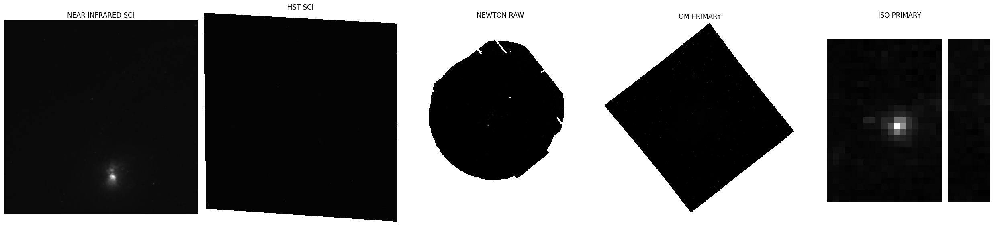

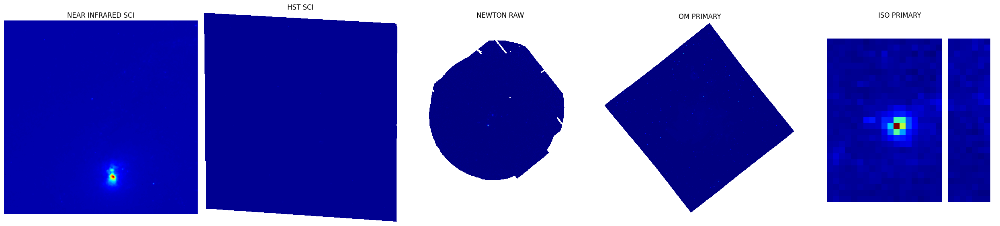

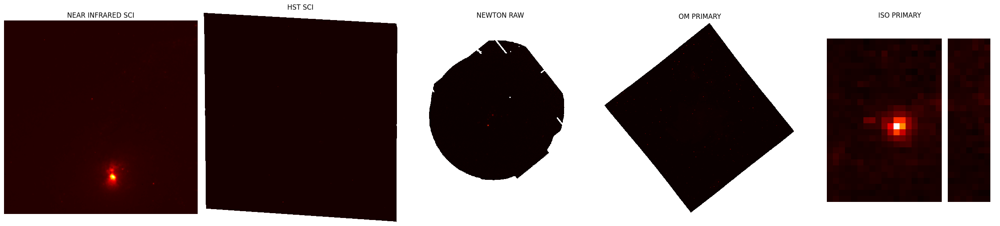

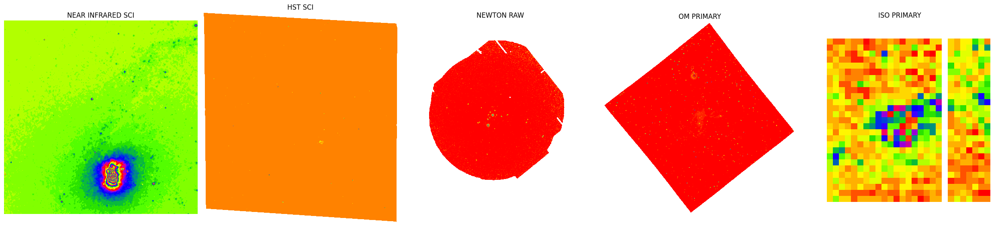

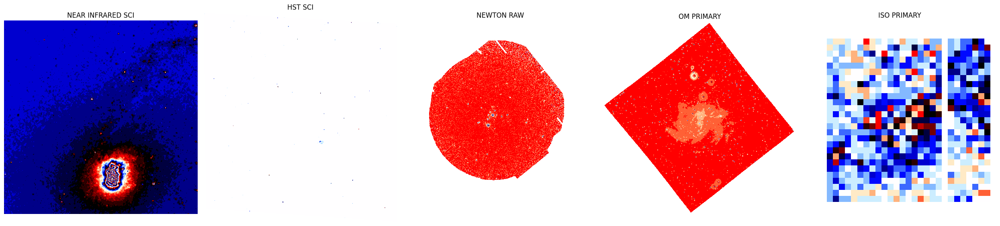

In [12]:
for x_spec in SPECTRAL_LIST:

    figure,axis = plt.subplots(1,5,figsize=(25,25))
    axis[0].imshow(NI_SCI / 255.,cmap=x_spec)
    axis[0].set_title("NEAR INFRARED SCI")
    axis[0].axis("off")

    axis[1].imshow(HST_SCI / 255.,cmap=x_spec)
    axis[1].set_title("HST SCI")
    axis[1].axis("off")

    axis[2].imshow(NEWTON_RAW[2] / 255.,cmap=x_spec)
    axis[2].set_title("NEWTON RAW")
    axis[2].axis("off")

    axis[3].imshow(OM_PRIMARY / 255.,cmap=x_spec)
    axis[3].set_title("OM PRIMARY")
    axis[3].axis("off")

    axis[4].imshow(ISO_PRIMARY[1] / 255.,cmap=x_spec)
    axis[4].set_title("ISO PRIMARY")
    axis[4].axis("off")

    plt.tight_layout()
    plt.show()

In [13]:
# crop the specific part of the image
NUCLEUS_SCALE_NI = NI_SCI[190:220,120:165]
ZOOMED_SCALE_NI = NI_SCI[150:,95:195]

NUCLEUS_SCALE_HST = HST_SCI[2640:2850,2330:2650]
ZOOMED_SCALE_HST = HST_SCI[1800:3400,1700:3200]

NUCLEUS_SCALE_NEWTON = NEWTON_RAW[2][270:370,240:340]

ZOOMED_SCALE_OM = OM_PRIMARY[370:1055,420:1070]
NUCLEUS_SCALE_OM = OM_PRIMARY[500:950,500:950]
ISO_CONS_SCALE = ISO_PRIMARY[1][:,7:22]

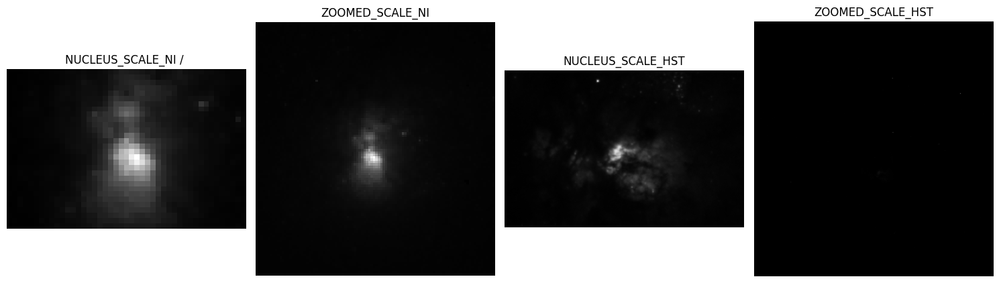

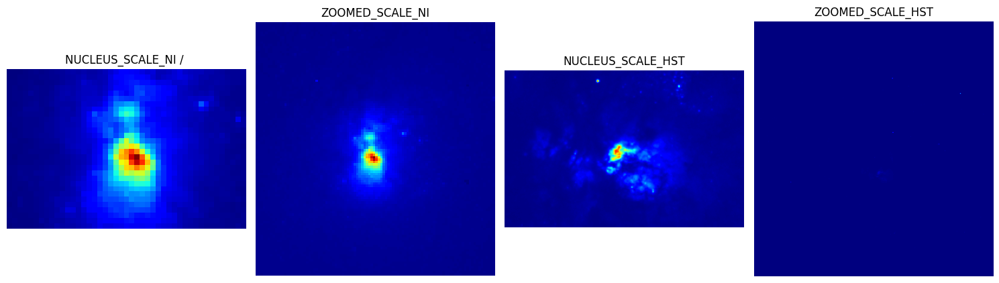

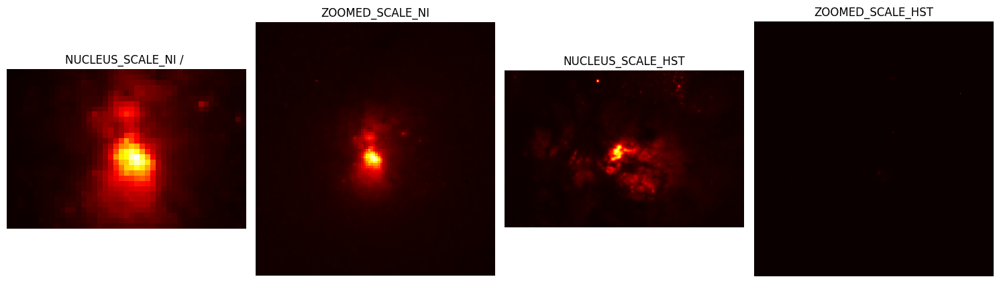

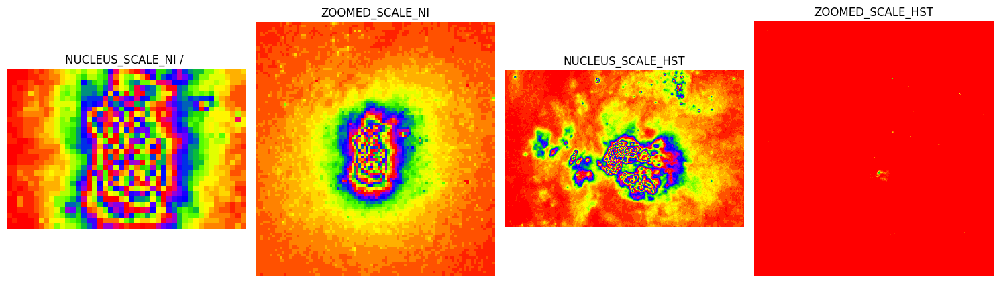

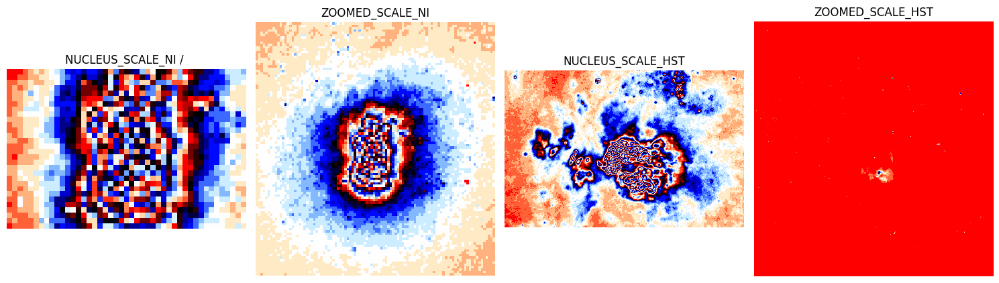

In [14]:
for x_spec in SPECTRAL_LIST:

    figure,axis = plt.subplots(1,4,figsize=(15,15))
    axis[0].imshow(NUCLEUS_SCALE_NI / 255.,cmap=x_spec)
    axis[0].set_title("NUCLEUS_SCALE_NI / ")
    axis[0].axis("off")

    axis[1].imshow(ZOOMED_SCALE_NI / 255.,cmap=x_spec)
    axis[1].set_title("ZOOMED_SCALE_NI")
    axis[1].axis("off")

    axis[2].imshow(NUCLEUS_SCALE_HST / 255.,cmap=x_spec)
    axis[2].set_title("NUCLEUS_SCALE_HST")
    axis[2].axis("off")

    axis[3].imshow(ZOOMED_SCALE_HST / 255.,cmap=x_spec)
    axis[3].set_title("ZOOMED_SCALE_HST")
    axis[3].axis("off")

    plt.tight_layout()
    plt.show()

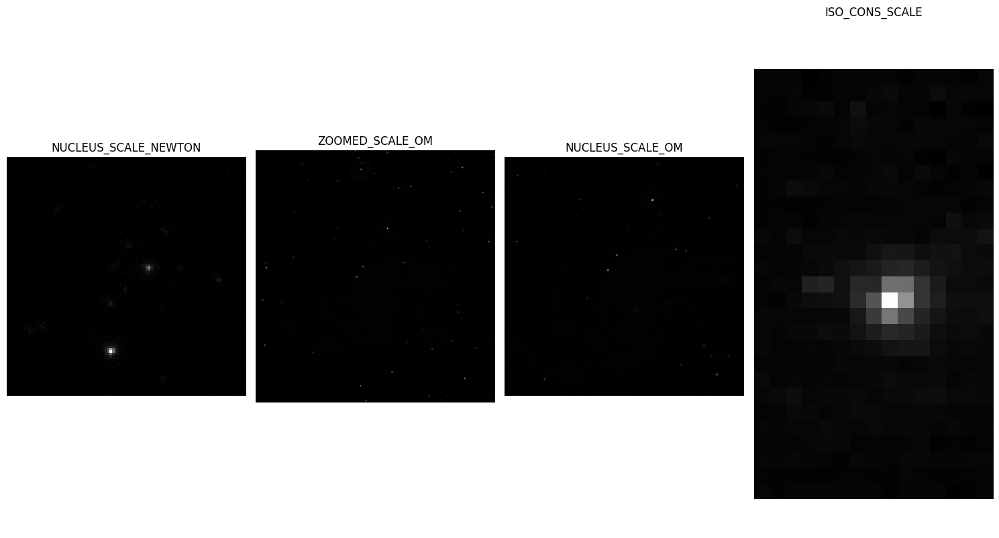

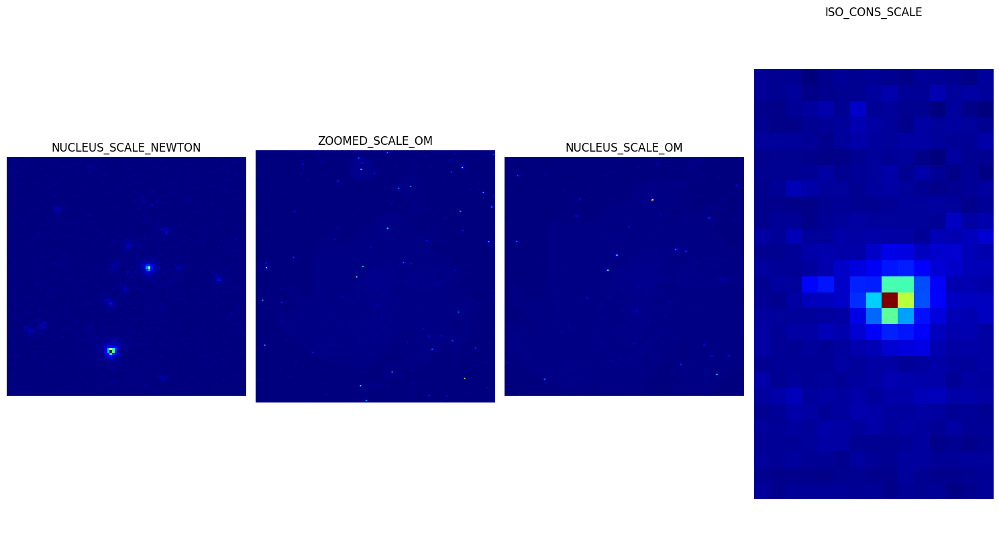

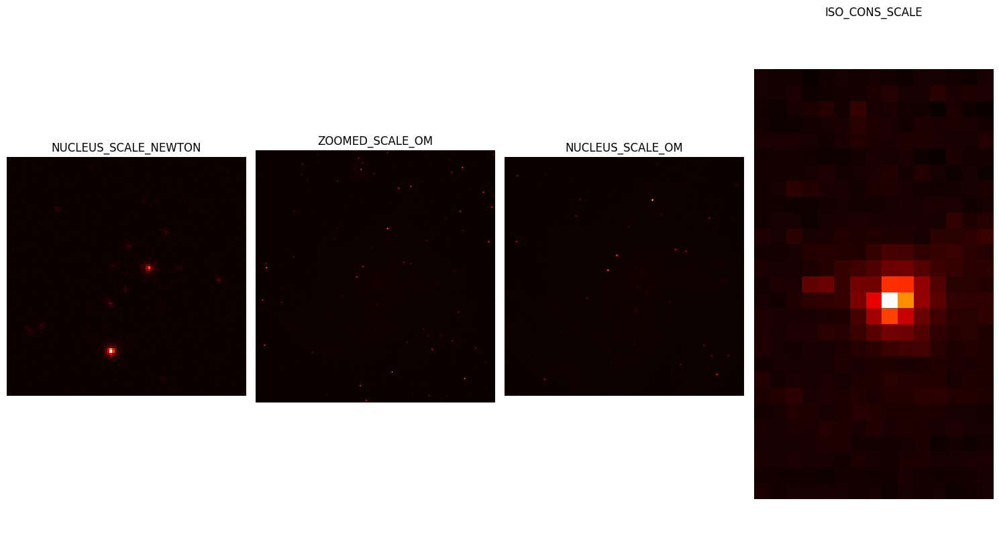

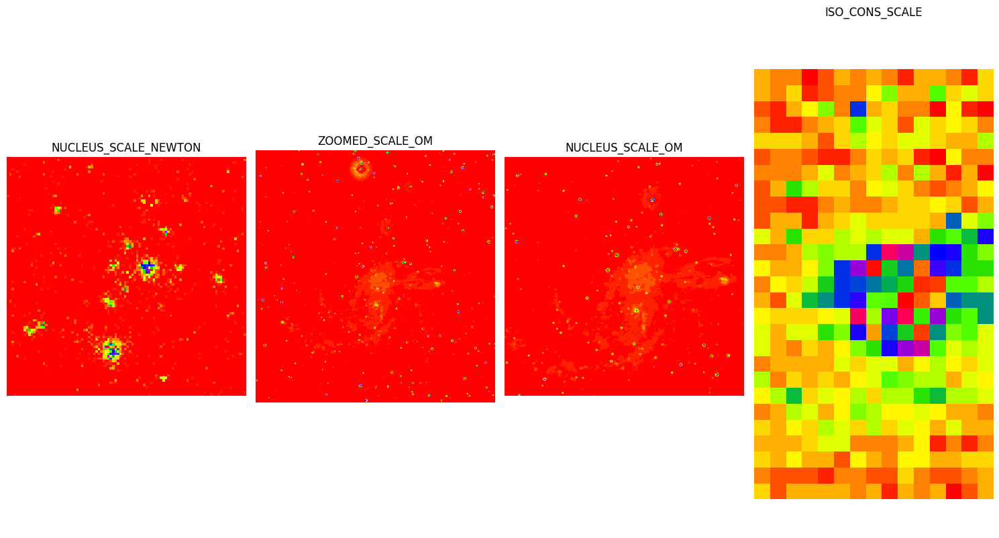

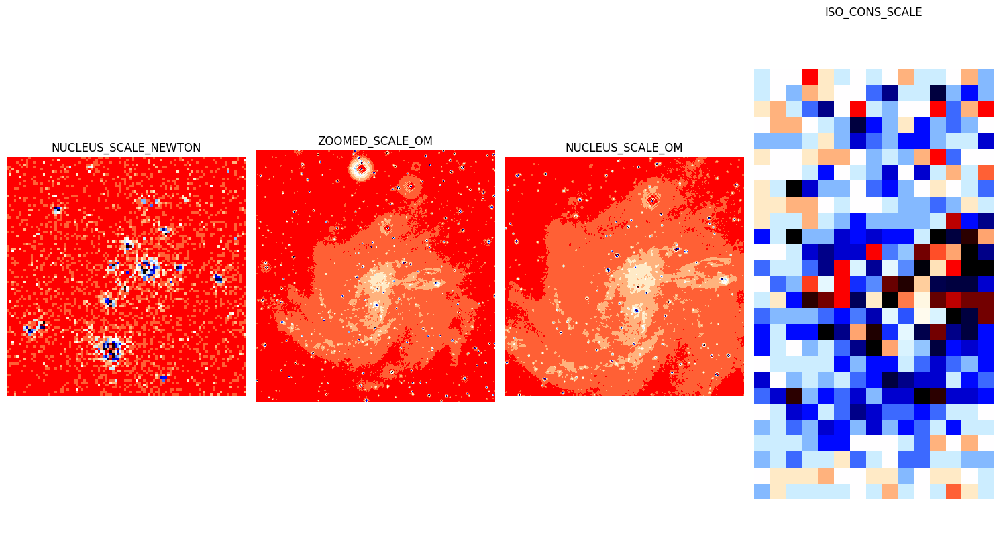

In [15]:
for x_spec in SPECTRAL_LIST:

    figure,axis = plt.subplots(1,4,figsize=(15,15))
    axis[0].imshow(NUCLEUS_SCALE_NEWTON / 255.,cmap=x_spec)
    axis[0].set_title("NUCLEUS_SCALE_NEWTON")
    axis[0].axis("off")

    axis[1].imshow(ZOOMED_SCALE_OM / 255.,cmap=x_spec)
    axis[1].set_title("ZOOMED_SCALE_OM")
    axis[1].axis("off")

    axis[2].imshow(NUCLEUS_SCALE_OM / 255.,cmap=x_spec)
    axis[2].set_title("NUCLEUS_SCALE_OM")
    axis[2].axis("off")

    axis[3].imshow(ISO_CONS_SCALE / 255.,cmap=x_spec)
    axis[3].set_title("ISO_CONS_SCALE")
    axis[3].axis("off")

    plt.tight_layout()
    plt.show()

In [16]:
# Write your inference here
print("1. The FITS files containing the NGC 6946 galaxy datasets were accessed. These files included the NI, HST, NEWTON, OM, and ISO FITS file.")
print("2. The primary HDU header and 14 Image HDUs were examined. After plotting all the Image HDUs, it was observed that only five images provided a clear view.\n These images were identified as NI_SCI, HST_SCI, NEWTON_RAW, OM_PRIMARY, and ISO_PRIMARY. ")
print("3. A specific portion of the image containing the desired features was cropped. This cropped portion was then plotted using four different colormaps (cmap) for visualization. ")
print("4. It was observed that in the ZOOMED_SCALE_OM image with the flag colormap, the spiral arms of the NGC 6946 galaxy were clearly visible ")
print("5. Additionally, the NUCLEUS_SCALE_HST image with the hot colormap revealed the presence of clouds in the galaxys nucleus.")

1. The FITS files containing the NGC 6946 galaxy datasets were accessed. These files included the NI, HST, NEWTON, OM, and ISO FITS file.
2. The primary HDU header and 14 Image HDUs were examined. After plotting all the Image HDUs, it was observed that only five images provided a clear view.
 These images were identified as NI_SCI, HST_SCI, NEWTON_RAW, OM_PRIMARY, and ISO_PRIMARY. 
3. A specific portion of the image containing the desired features was cropped. This cropped portion was then plotted using four different colormaps (cmap) for visualization. 
4. It was observed that in the ZOOMED_SCALE_OM image with the flag colormap, the spiral arms of the NGC 6946 galaxy were clearly visible 
5. Additionally, the NUCLEUS_SCALE_HST image with the hot colormap revealed the presence of clouds in the galaxys nucleus.


# Q6 (15 Points)

To prove your hypothesis in question 4 and have better insights on data:
  - Use atleast 4 filters and view them in atleast 5 different colormaps.

  - Provide a complete summary for every filter explaining what type of insights we are getting by applying it.

  - Write on which filter and colormap gave better insights

In [17]:
# import necessary libraries
from astropy.io import fits
from skimage import filters

#Get dataset

# !mkdir ~/.kaggle
# !cp '/content/drive/MyDrive/kaggle.json' ~/.kaggle/
# !chmod 600 ~/.kaggle/kaggle.json
# !kaggle datasets download -d brsdincer/center-of-all-observable-galaxiesfits-allesa
# !unzip -q center-of-all-observable-galaxiesfits-allesa.zip
# # Open the fits data
# #NGC 6946

HST_OPTICAL_PATH =  '/content/GALAXIES_CENTER/NGC6946/OPTICAL/HST/idk404050/idk404050_drc.fits'
NEAR_INFRARED_PATH = '/content/GALAXIES_CENTER/NGC6946/NEAR_INFRARED/n4k48nbsq_cal.fits'
NEWTON_PATH = '/content/GALAXIES_CENTER/NGC6946/XMM_NEWTON_Soft_Xray/P0200670301EPX0003COLIM8000.FTZ'
OM_PATH = '/content/GALAXIES_CENTER/NGC6946/XMM_OM_Optical/P0200670301OMX000LSIMAGB000.FTZ'
ISO_PATH = '/content/GALAXIES_CENTER/NGC6946/ISO/csp3390040401.fits'

HST_OPEN = fits.open(HST_OPTICAL_PATH)
NI_OPEN = fits.open(NEAR_INFRARED_PATH)
NEWTON_OPEN = fits.open(NEWTON_PATH)
OM_OPEN = fits.open(OM_PATH)
ISO_OPEN = fits.open(ISO_PATH)

# Perform filtering



In [18]:
#Write your code here
# apply filter on the images
SATO_ZOOMED_SCALE_NI = filters.sato(ZOOMED_SCALE_NI)
SATO_NUCLEUS_SCALE_NI = filters.sato(NUCLEUS_SCALE_NI)

SATO_ZOOMED_SCALE_HST = filters.sato(ZOOMED_SCALE_HST)
SATO_NUCLEUS_SCALE_HST = filters.sato(NUCLEUS_SCALE_HST)

SATO_NUCLEUS_SCALE_NEWTON = filters.sato(NUCLEUS_SCALE_NEWTON)

SATO_ZOOMED_SCALE_OM = filters.sato(ZOOMED_SCALE_OM)
SATO_NUCLEUS_SCALE_OM = filters.sato(NUCLEUS_SCALE_OM)

SATO_ISO_CONS_SCALE = filters.sato(ISO_CONS_SCALE)

#---------------------------------------------------------------------------

M_ZOOMED_SCALE_NI = filters.meijering(ZOOMED_SCALE_NI)
M_NUCLEUS_SCALE_NI = filters.meijering(NUCLEUS_SCALE_NI)

M_ZOOMED_SCALE_HST = filters.meijering(ZOOMED_SCALE_HST)
M_NUCLEUS_SCALE_HST = filters.meijering(NUCLEUS_SCALE_HST)

M_NUCLEUS_SCALE_NEWTON = filters.meijering(NUCLEUS_SCALE_NEWTON)

M_ZOOMED_SCALE_OM = filters.meijering(ZOOMED_SCALE_OM)
M_NUCLEUS_SCALE_OM = filters.meijering(NUCLEUS_SCALE_OM)

M_ISO_CONS_SCALE = filters.meijering(ISO_CONS_SCALE)

#-------------------------------------------------------------------------------

BM_ZOOMED_SCALE_NI = filters.meijering(ZOOMED_SCALE_NI,black_ridges=False)
BM_NUCLEUS_SCALE_NI = filters.meijering(NUCLEUS_SCALE_NI,black_ridges=False)

BM_ZOOMED_SCALE_HST = filters.meijering(ZOOMED_SCALE_HST,black_ridges=False)
BM_NUCLEUS_SCALE_HST = filters.meijering(NUCLEUS_SCALE_HST,black_ridges=False)

BM_NUCLEUS_SCALE_NEWTON = filters.meijering(NUCLEUS_SCALE_NEWTON,black_ridges=False)

BM_ZOOMED_SCALE_OM = filters.meijering(ZOOMED_SCALE_OM,black_ridges=False)
BM_NUCLEUS_SCALE_OM = filters.meijering(NUCLEUS_SCALE_OM,black_ridges=False)

BM_ISO_CONS_SCALE = filters.meijering(ISO_CONS_SCALE,black_ridges=False)

#--------------------------------------------------------------------------------

R_ZOOMED_SCALE_NI = filters.roberts_neg_diag(ZOOMED_SCALE_NI)
R_NUCLEUS_SCALE_NI = filters.roberts_neg_diag(NUCLEUS_SCALE_NI)
R_ZOOMED_SCALE_HST = filters.roberts_neg_diag(ZOOMED_SCALE_HST)
R_NUCLEUS_SCALE_HST = filters.roberts_neg_diag(NUCLEUS_SCALE_HST)

R_NUCLEUS_SCALE_NEWTON = filters.roberts_neg_diag(NUCLEUS_SCALE_NEWTON)

R_ZOOMED_SCALE_OM = filters.roberts_neg_diag(ZOOMED_SCALE_OM)
R_NUCLEUS_SCALE_OM = filters.roberts_neg_diag(NUCLEUS_SCALE_OM)

R_ISO_CONS_SCALE = filters.roberts_neg_diag(ISO_CONS_SCALE)

### Filter on ZOOMED_SCALE_NI

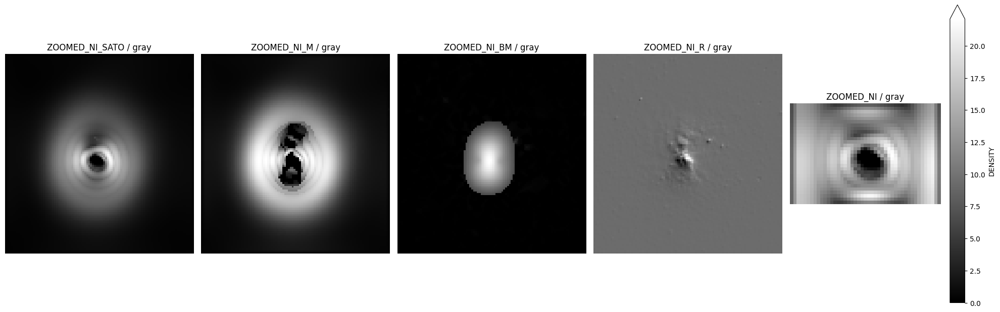

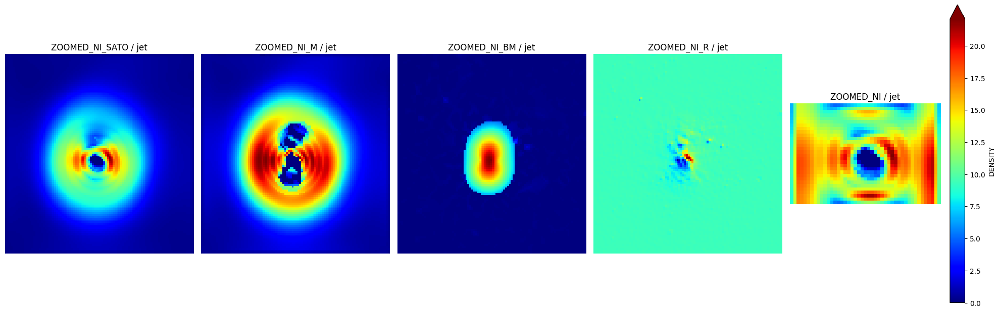

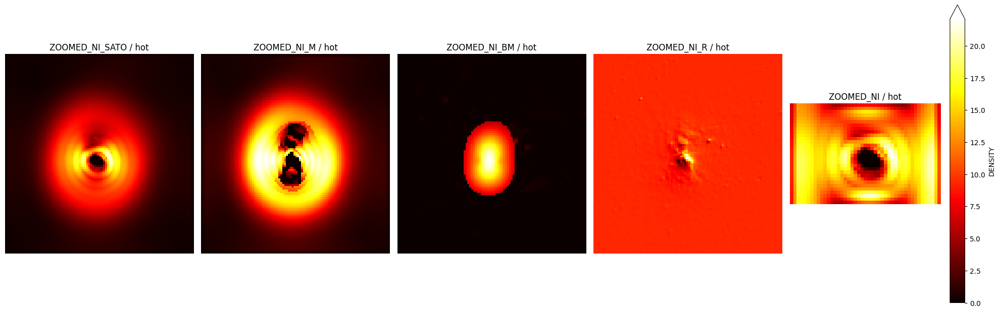

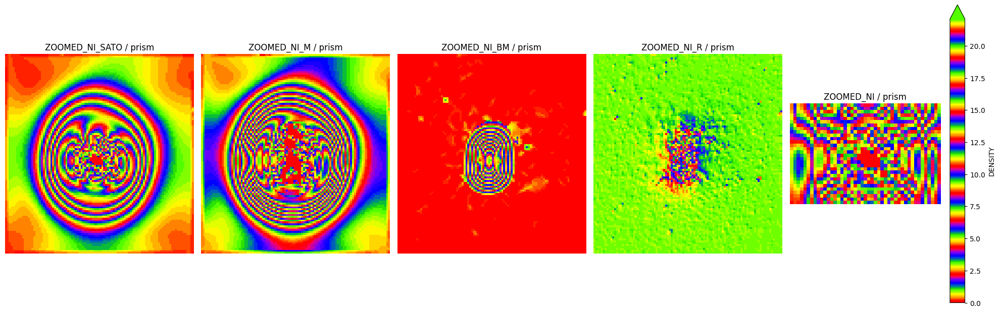

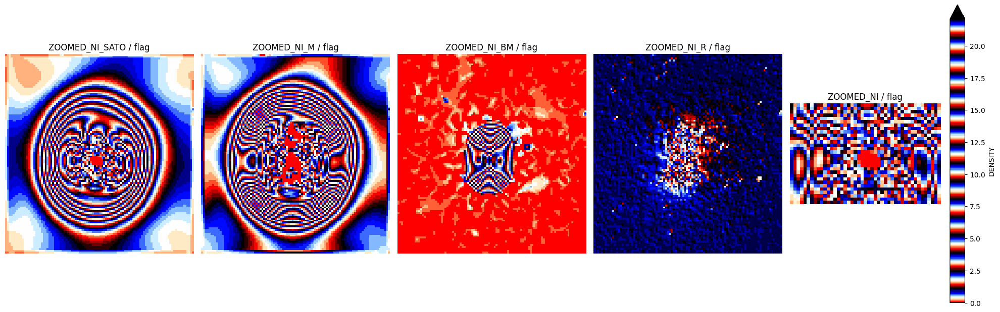

In [19]:
for x_spec in SPECTRAL_LIST:

    figure,axis = plt.subplots(1,5,figsize=(20,20))

    axis[0].imshow(SATO_ZOOMED_SCALE_NI,cmap=x_spec)
    axis[0].set_title("ZOOMED_NI_SATO" + " / "+ x_spec)
    axis[0].axis("off")

    axis[1].imshow(M_ZOOMED_SCALE_NI,cmap=x_spec)
    axis[1].set_title("ZOOMED_NI_M" + " / "+ x_spec)
    axis[1].axis("off")

    axis[2].imshow(BM_ZOOMED_SCALE_NI,cmap=x_spec)
    axis[2].set_title("ZOOMED_NI_BM" + " / "+ x_spec)
    axis[2].axis("off")

    axis[3].imshow(R_ZOOMED_SCALE_NI,cmap=x_spec)
    axis[3].set_title("ZOOMED_NI_R" + " / "+ x_spec)
    axis[3].axis("off")


    DENSITY_FUNC = axis[4].imshow(SATO_NUCLEUS_SCALE_NI,cmap=x_spec)
    axis[4].set_title("ZOOMED_NI" + " / "+ x_spec)
    axis[4].axis("off")

    figure.colorbar(DENSITY_FUNC,shrink=0.3,label="DENSITY",location="right",extend="max")
    plt.tight_layout()
    plt.show()

### Filters on NUCLEUS_SCALE_NI

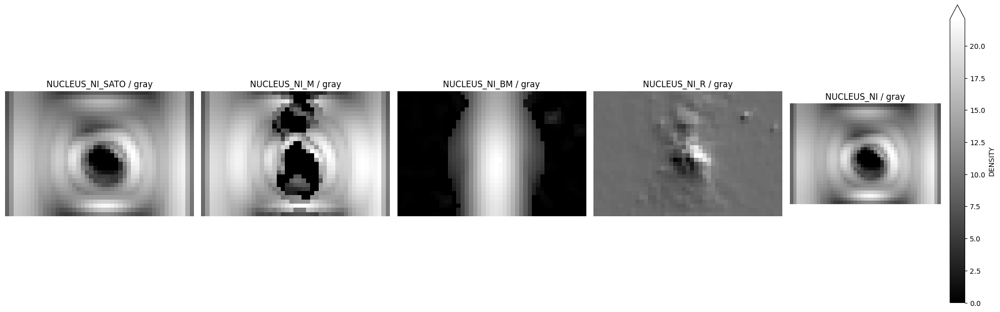

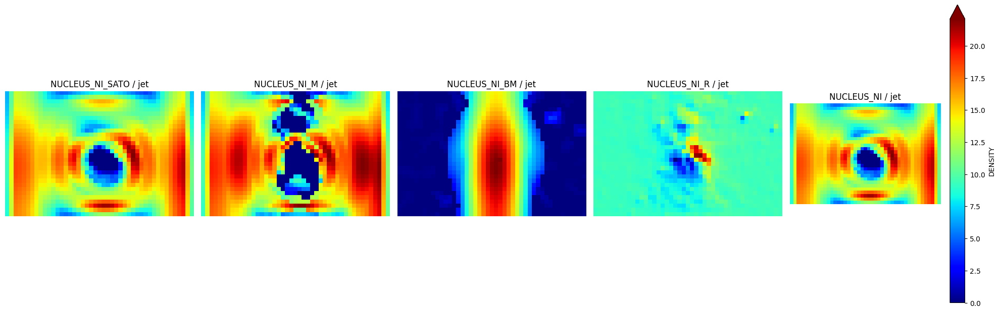

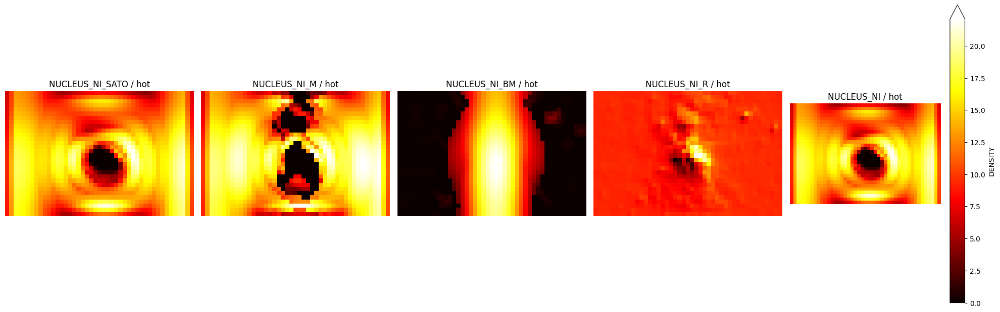

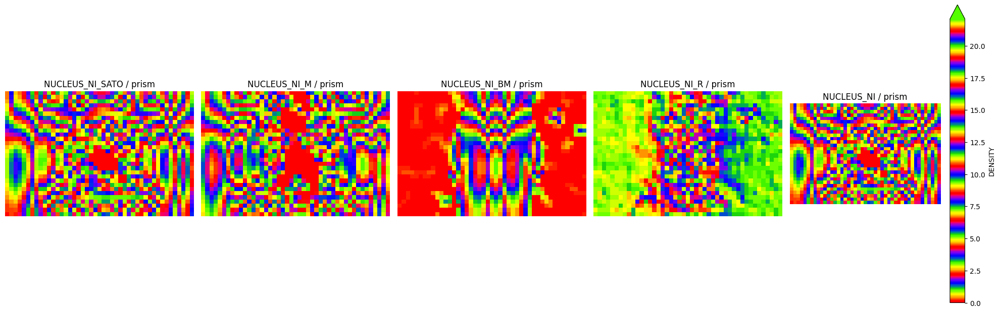

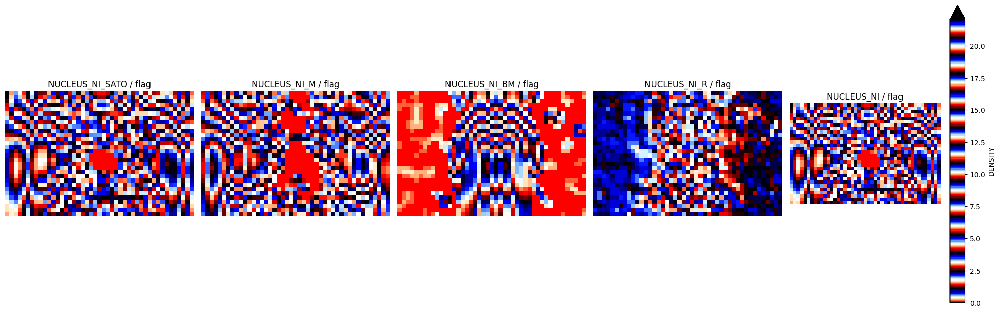

In [20]:
for x_spec in SPECTRAL_LIST:

    figure,axis = plt.subplots(1,5,figsize=(20,20))

    axis[0].imshow(SATO_NUCLEUS_SCALE_NI,cmap=x_spec)
    axis[0].set_title("NUCLEUS_NI_SATO" + " / "+ x_spec)
    axis[0].axis("off")

    axis[1].imshow(M_NUCLEUS_SCALE_NI,cmap=x_spec)
    axis[1].set_title("NUCLEUS_NI_M" + " / "+ x_spec)
    axis[1].axis("off")

    axis[2].imshow(BM_NUCLEUS_SCALE_NI,cmap=x_spec)
    axis[2].set_title("NUCLEUS_NI_BM" + " / "+ x_spec)
    axis[2].axis("off")

    axis[3].imshow(R_NUCLEUS_SCALE_NI,cmap=x_spec)
    axis[3].set_title("NUCLEUS_NI_R" + " / "+ x_spec)
    axis[3].axis("off")

    DENSITY_FUNC = axis[4].imshow(SATO_NUCLEUS_SCALE_NI,cmap=x_spec)
    axis[4].set_title("NUCLEUS_NI" + " / "+ x_spec)
    axis[4].axis("off")

    figure.colorbar(DENSITY_FUNC,shrink=0.3,label="DENSITY",location="right",extend="max")
    plt.tight_layout()
    plt.show()

# Filters on NUCLEUS_SCALE_HST

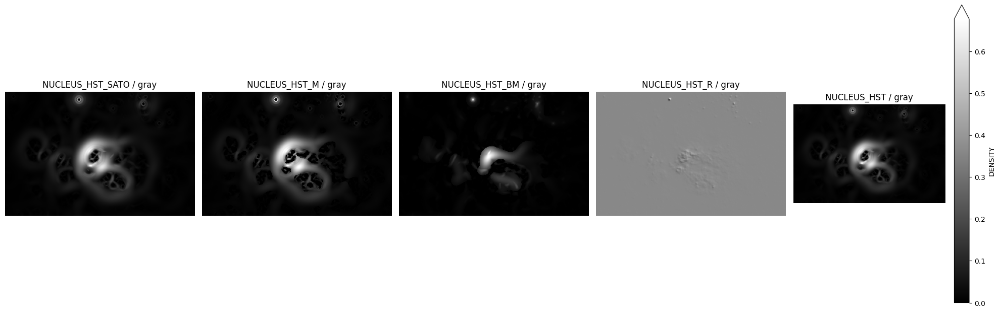

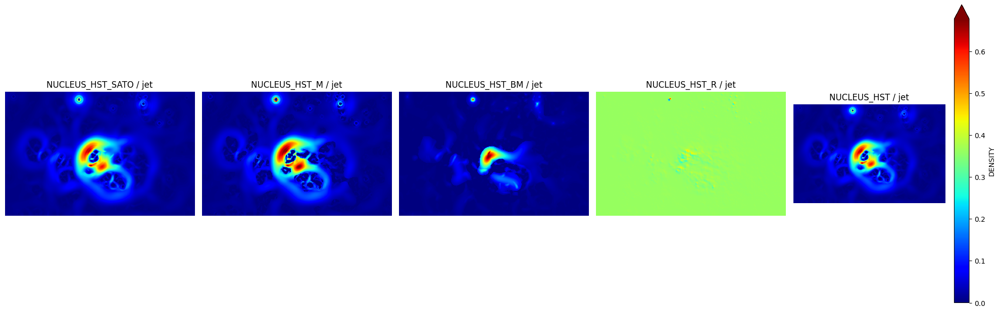

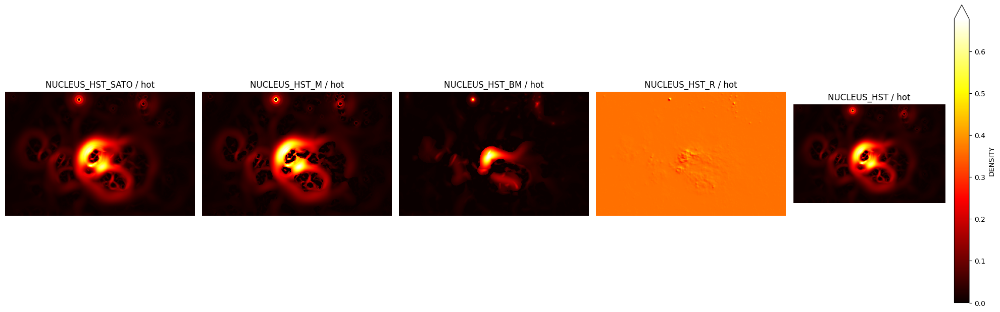

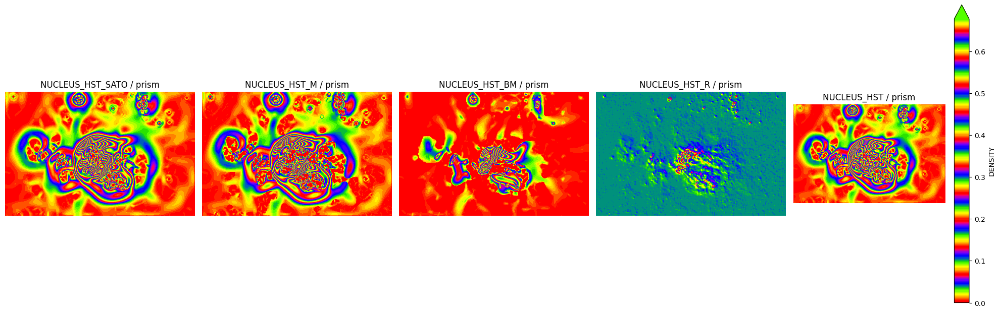

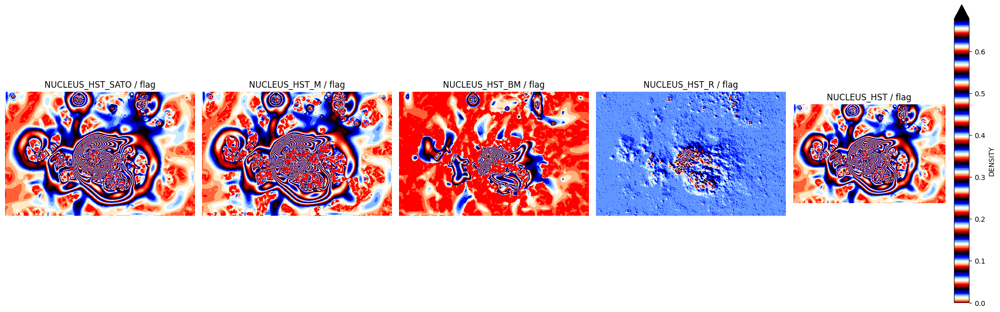

In [21]:
for x_spec in SPECTRAL_LIST:

    figure,axis = plt.subplots(1,5,figsize=(20,20))

    axis[0].imshow(SATO_NUCLEUS_SCALE_HST,cmap=x_spec)
    axis[0].set_title("NUCLEUS_HST_SATO" + " / "+ x_spec)
    axis[0].axis("off")

    axis[1].imshow(M_NUCLEUS_SCALE_HST,cmap=x_spec)
    axis[1].set_title("NUCLEUS_HST_M" + " / "+ x_spec)
    axis[1].axis("off")

    axis[2].imshow(BM_NUCLEUS_SCALE_HST,cmap=x_spec)
    axis[2].set_title("NUCLEUS_HST_BM" + " / "+ x_spec)
    axis[2].axis("off")

    axis[3].imshow(R_NUCLEUS_SCALE_HST,cmap=x_spec)
    axis[3].set_title("NUCLEUS_HST_R" + " / "+ x_spec)
    axis[3].axis("off")


    DENSITY_FUNC = axis[4].imshow(SATO_NUCLEUS_SCALE_HST,cmap=x_spec)
    axis[4].set_title("NUCLEUS_HST" + " / "+ x_spec)
    axis[4].axis("off")

    figure.colorbar(DENSITY_FUNC,shrink=0.3,label="DENSITY",location="right",extend="max")
    plt.tight_layout()
    plt.show()

#Filters on ZOOMED_SCALE_HST

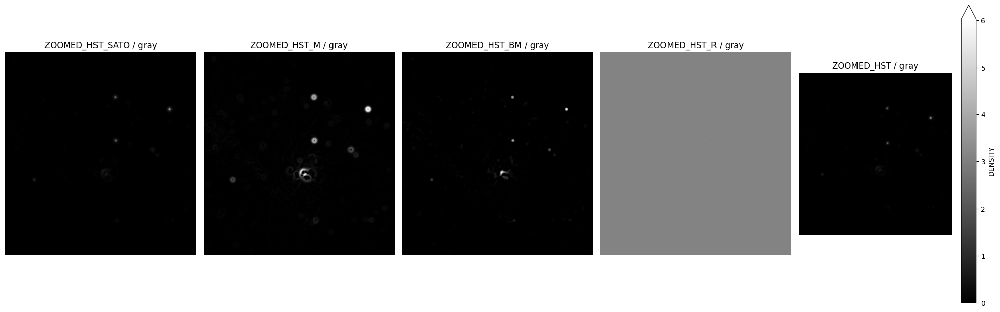

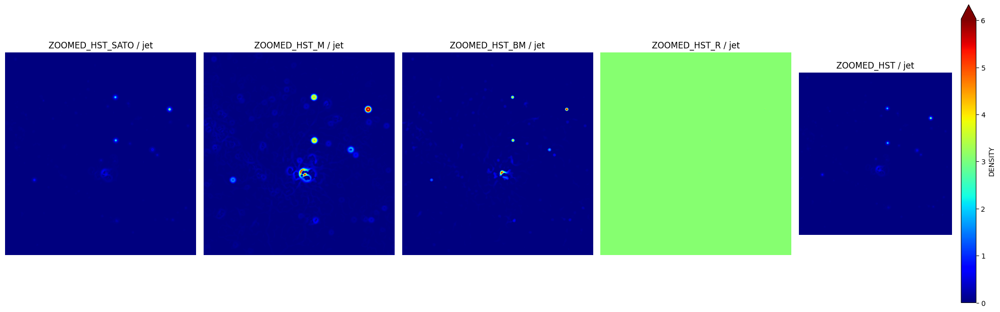

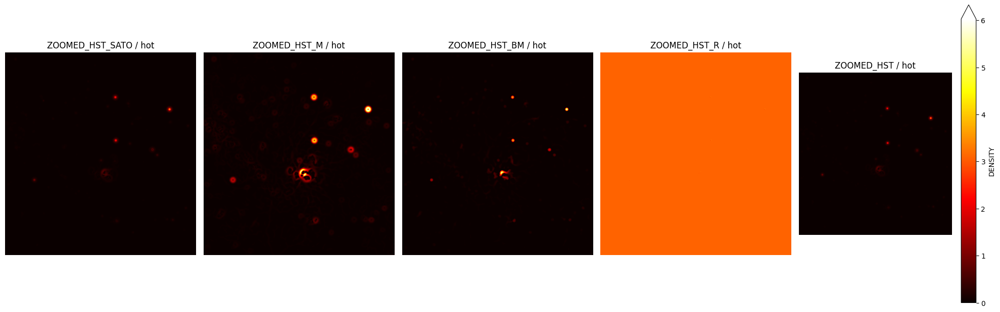

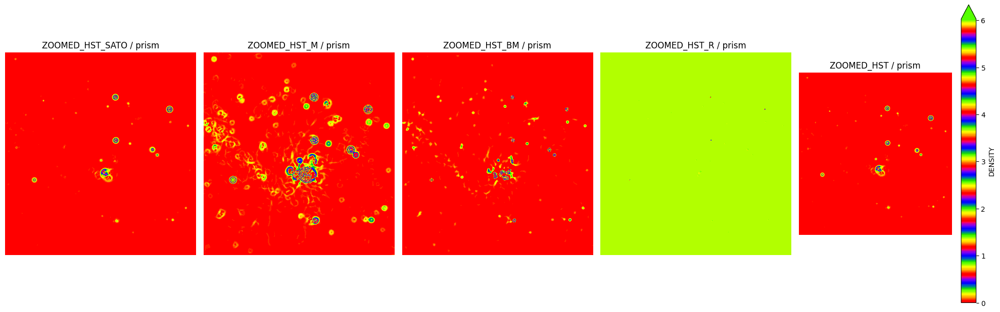

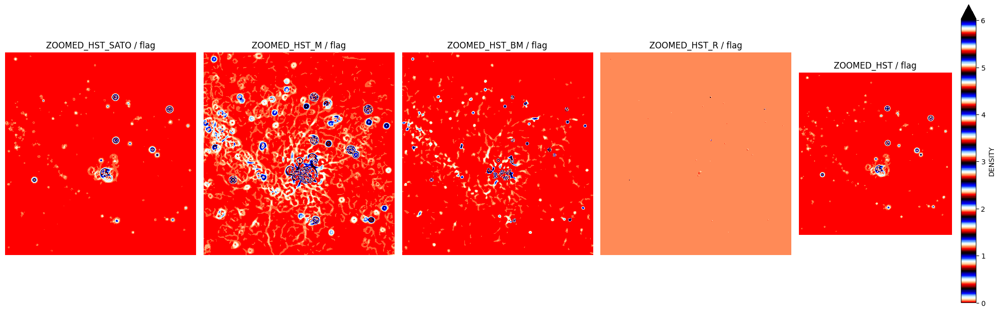

In [22]:
for x_spec in SPECTRAL_LIST:

    figure,axis = plt.subplots(1,5,figsize=(20,20))

    axis[0].imshow(SATO_ZOOMED_SCALE_HST,cmap=x_spec)
    axis[0].set_title("ZOOMED_HST_SATO" + " / "+ x_spec)
    axis[0].axis("off")

    axis[1].imshow(M_ZOOMED_SCALE_HST,cmap=x_spec)
    axis[1].set_title("ZOOMED_HST_M" + " / "+ x_spec)
    axis[1].axis("off")

    axis[2].imshow(BM_ZOOMED_SCALE_HST,cmap=x_spec)
    axis[2].set_title("ZOOMED_HST_BM" + " / "+ x_spec)
    axis[2].axis("off")

    axis[3].imshow(R_ZOOMED_SCALE_HST,cmap=x_spec)
    axis[3].set_title("ZOOMED_HST_R" + " / "+ x_spec)
    axis[3].axis("off")


    DENSITY_FUNC = axis[4].imshow(SATO_ZOOMED_SCALE_HST,cmap=x_spec)
    axis[4].set_title("ZOOMED_HST" + " / "+ x_spec)
    axis[4].axis("off")

    figure.colorbar(DENSITY_FUNC,shrink=0.3,label="DENSITY",location="right",extend="max")
    plt.tight_layout()
    plt.show()

#Filters on ZOOMED_SCALE_OM

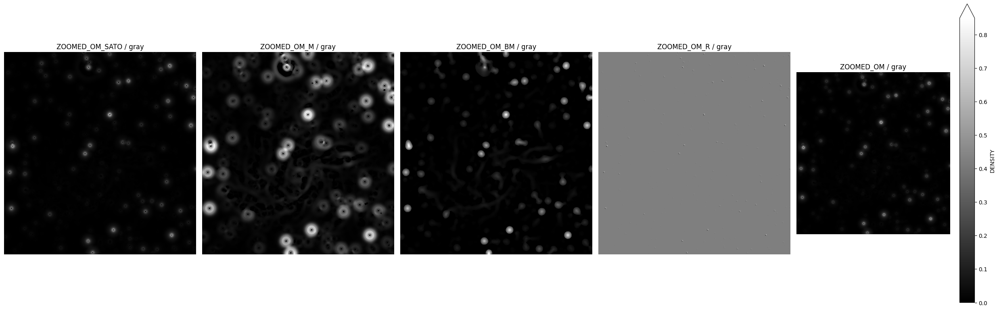

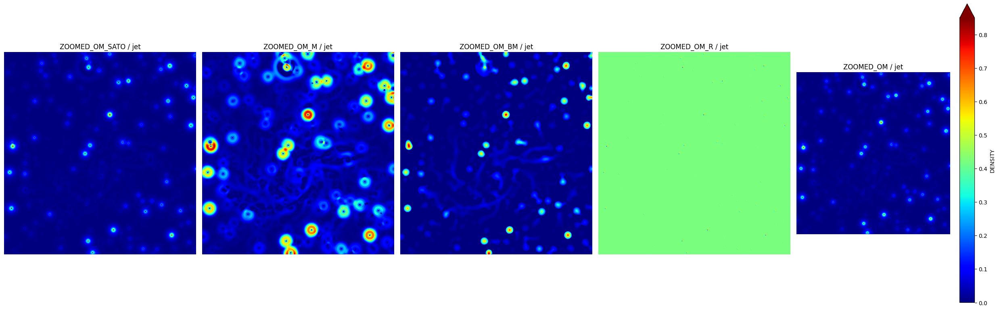

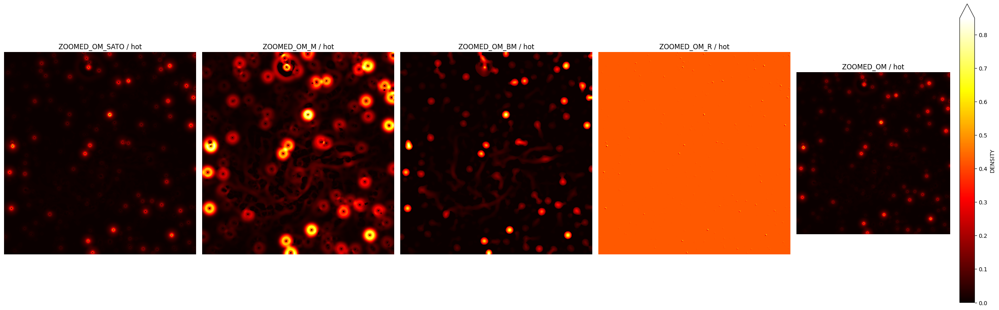

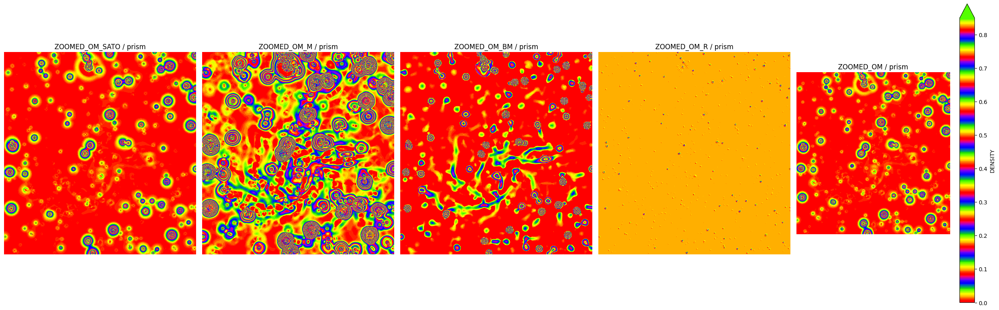

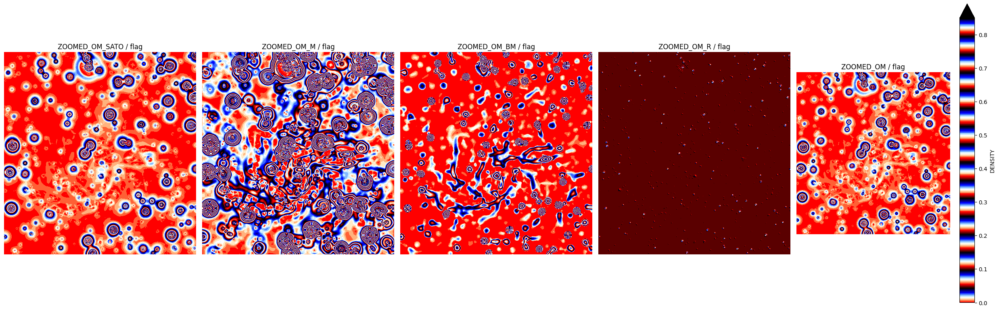

In [23]:
for x_spec in SPECTRAL_LIST:

    figure,axis = plt.subplots(1,5,figsize=(25,25))

    axis[0].imshow(SATO_ZOOMED_SCALE_OM,cmap=x_spec)
    axis[0].set_title("ZOOMED_OM_SATO" + " / "+ x_spec)
    axis[0].axis("off")

    axis[1].imshow(M_ZOOMED_SCALE_OM,cmap=x_spec)
    axis[1].set_title("ZOOMED_OM_M" + " / "+ x_spec)
    axis[1].axis("off")

    axis[2].imshow(BM_ZOOMED_SCALE_OM,cmap=x_spec)
    axis[2].set_title("ZOOMED_OM_BM" + " / "+ x_spec)
    axis[2].axis("off")

    axis[3].imshow(R_ZOOMED_SCALE_OM,cmap=x_spec)
    axis[3].set_title("ZOOMED_OM_R" + " / "+ x_spec)
    axis[3].axis("off")

    DENSITY_FUNC = axis[4].imshow(SATO_ZOOMED_SCALE_OM,cmap=x_spec)
    axis[4].set_title("ZOOMED_OM" + " / "+ x_spec)
    axis[4].axis("off")

    figure.colorbar(DENSITY_FUNC,shrink=0.3,label="DENSITY",location="right",extend="max")
    plt.tight_layout()
    plt.show()

#Filters on NUCLUES_SCALE_OM

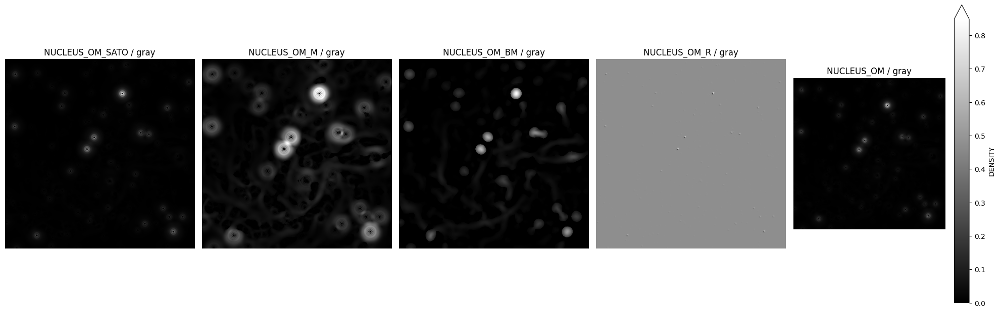

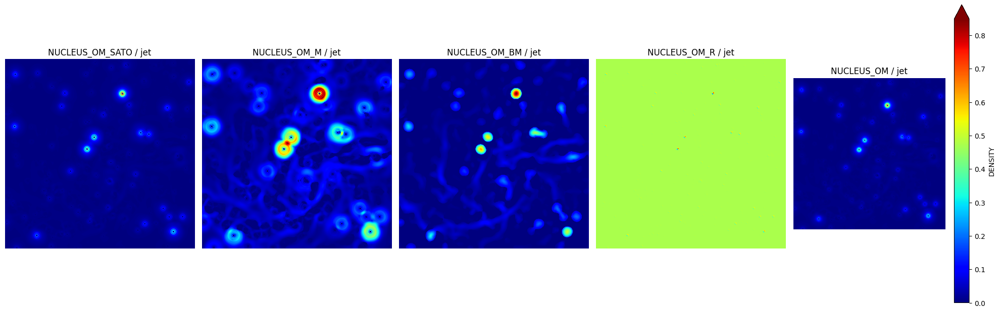

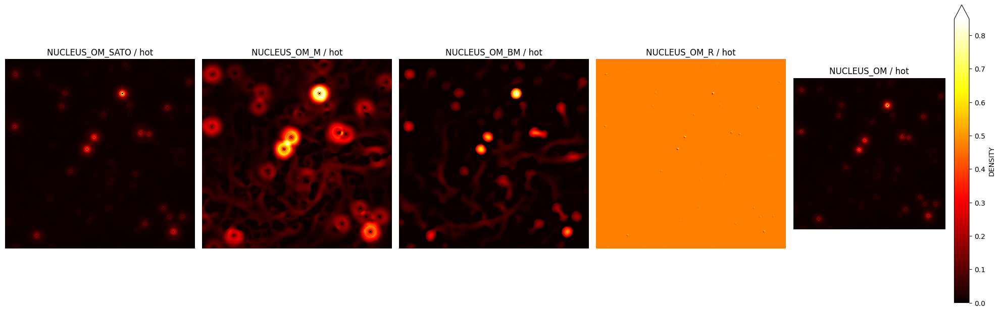

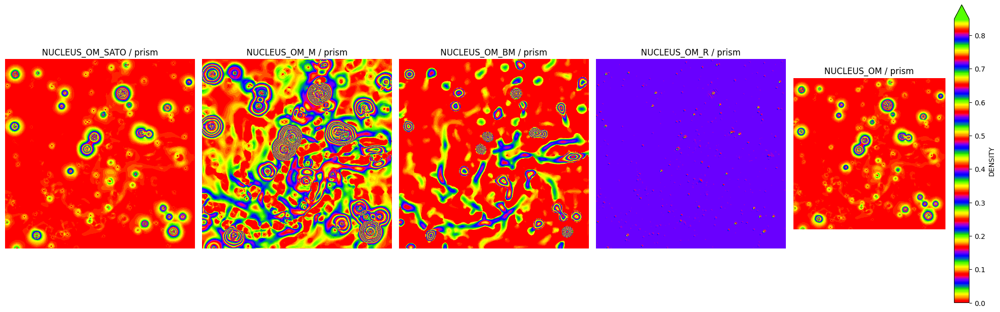

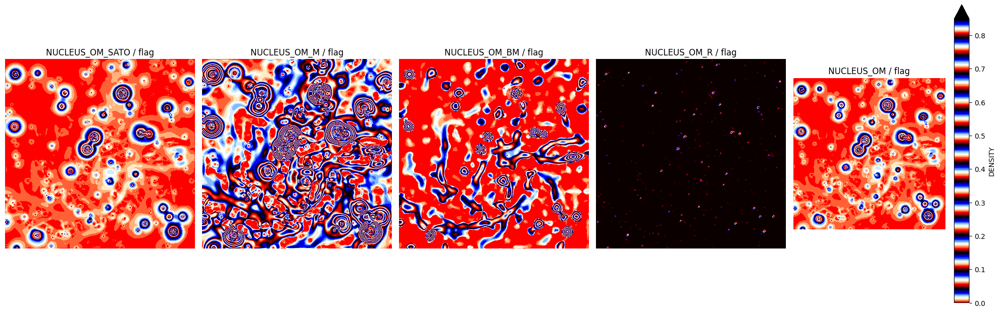

In [24]:
for x_spec in SPECTRAL_LIST:

    figure,axis = plt.subplots(1,5,figsize=(20,20))

    axis[0].imshow(SATO_NUCLEUS_SCALE_OM,cmap=x_spec)
    axis[0].set_title("NUCLEUS_OM_SATO" + " / "+ x_spec)
    axis[0].axis("off")

    axis[1].imshow(M_NUCLEUS_SCALE_OM,cmap=x_spec)
    axis[1].set_title("NUCLEUS_OM_M" + " / "+ x_spec)
    axis[1].axis("off")

    axis[2].imshow(BM_NUCLEUS_SCALE_OM,cmap=x_spec)
    axis[2].set_title("NUCLEUS_OM_BM" + " / "+ x_spec)
    axis[2].axis("off")

    axis[3].imshow(R_NUCLEUS_SCALE_OM,cmap=x_spec)
    axis[3].set_title("NUCLEUS_OM_R" + " / "+ x_spec)
    axis[3].axis("off")


    DENSITY_FUNC = axis[4].imshow(SATO_NUCLEUS_SCALE_OM,cmap=x_spec)
    axis[4].set_title("NUCLEUS_OM" + " / "+ x_spec)
    axis[4].axis("off")

    figure.colorbar(DENSITY_FUNC,shrink=0.3,label="DENSITY",location="right",extend="max")
    plt.tight_layout()
    plt.show()

#Filters on NUCLUES_SCALE_NEWTON

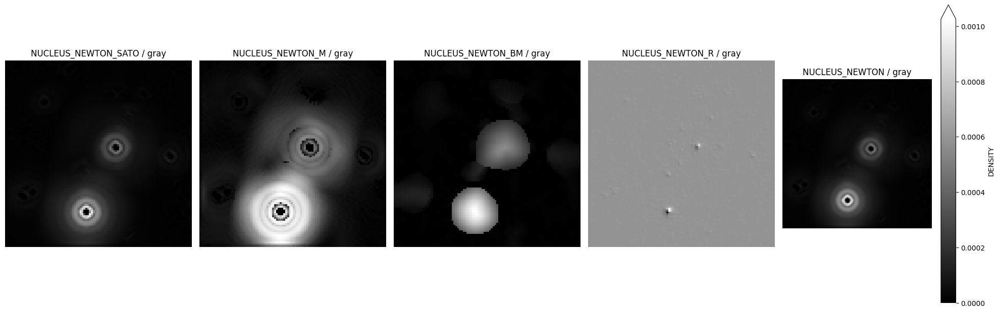

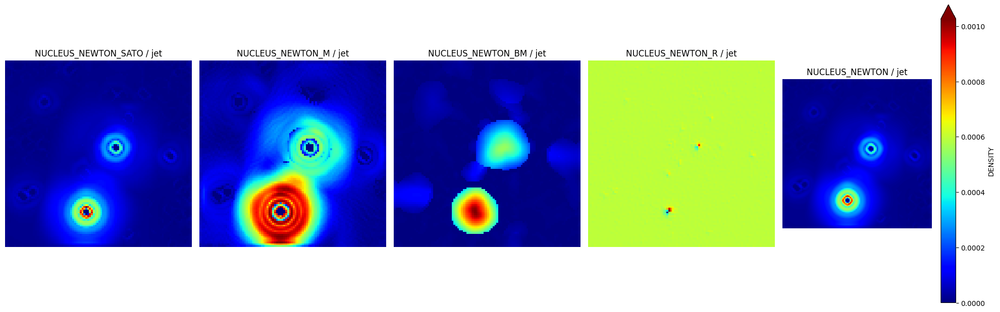

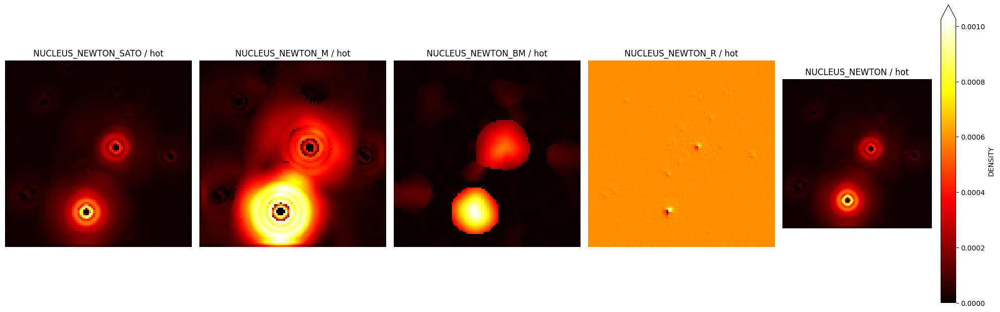

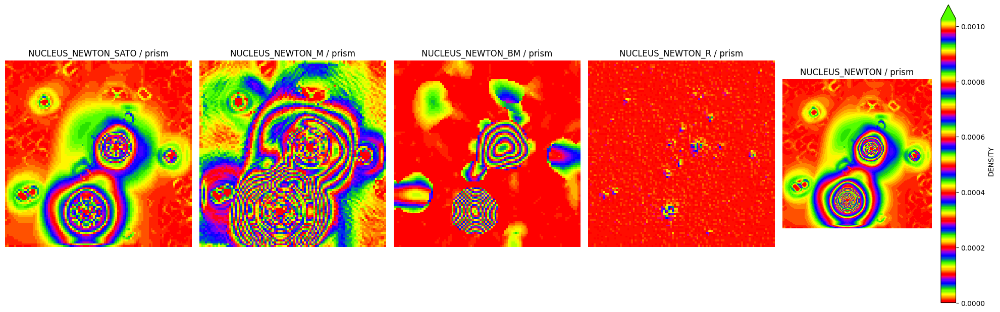

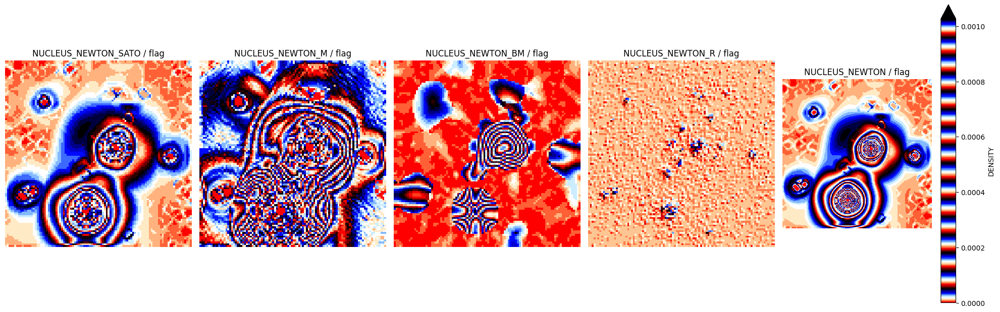

In [25]:
for x_spec in SPECTRAL_LIST:

    figure,axis = plt.subplots(1,5,figsize=(20,20))

    axis[0].imshow(SATO_NUCLEUS_SCALE_NEWTON,cmap=x_spec)
    axis[0].set_title("NUCLEUS_NEWTON_SATO" + " / "+ x_spec)
    axis[0].axis("off")

    axis[1].imshow(M_NUCLEUS_SCALE_NEWTON,cmap=x_spec)
    axis[1].set_title("NUCLEUS_NEWTON_M" + " / "+ x_spec)
    axis[1].axis("off")

    axis[2].imshow(BM_NUCLEUS_SCALE_NEWTON,cmap=x_spec)
    axis[2].set_title("NUCLEUS_NEWTON_BM" + " / "+ x_spec)
    axis[2].axis("off")

    axis[3].imshow(R_NUCLEUS_SCALE_NEWTON,cmap=x_spec)
    axis[3].set_title("NUCLEUS_NEWTON_R" + " / "+ x_spec)
    axis[3].axis("off")


    DENSITY_FUNC = axis[4].imshow(SATO_NUCLEUS_SCALE_NEWTON,cmap=x_spec)
    axis[4].set_title("NUCLEUS_NEWTON" + " / "+ x_spec)
    axis[4].axis("off")

    figure.colorbar(DENSITY_FUNC,shrink=0.3,label="DENSITY",location="right",extend="max")
    plt.tight_layout()
    plt.show()

# other

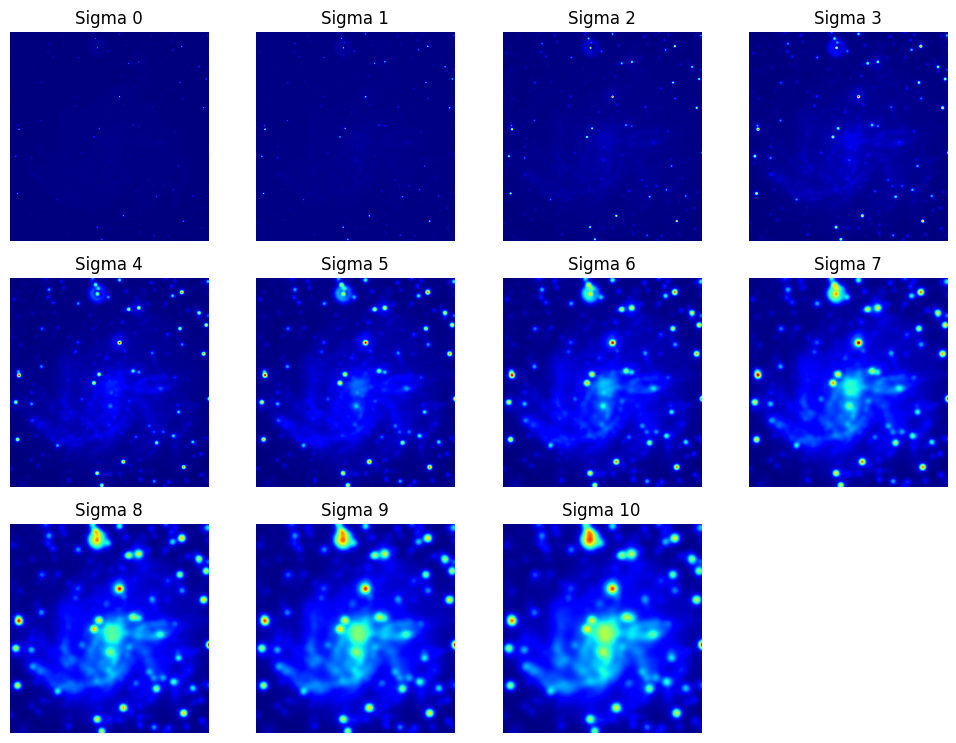

In [26]:
import matplotlib.pyplot as plt
from skimage import filters

plt.figure(figsize=(10, 10))
for i in range(11):
    plt.subplot(4, 4, i+1)
    filtered_image = filters.gaussian(ZOOMED_SCALE_OM, i)
    plt.imshow(filtered_image, cmap='jet')
    plt.title(f'Sigma {i}')
    plt.axis('off')

plt.tight_layout()
plt.show()

# we can see a spirals of the galaxy after applying gausian filter on a ZOOMED_SCALE_OM

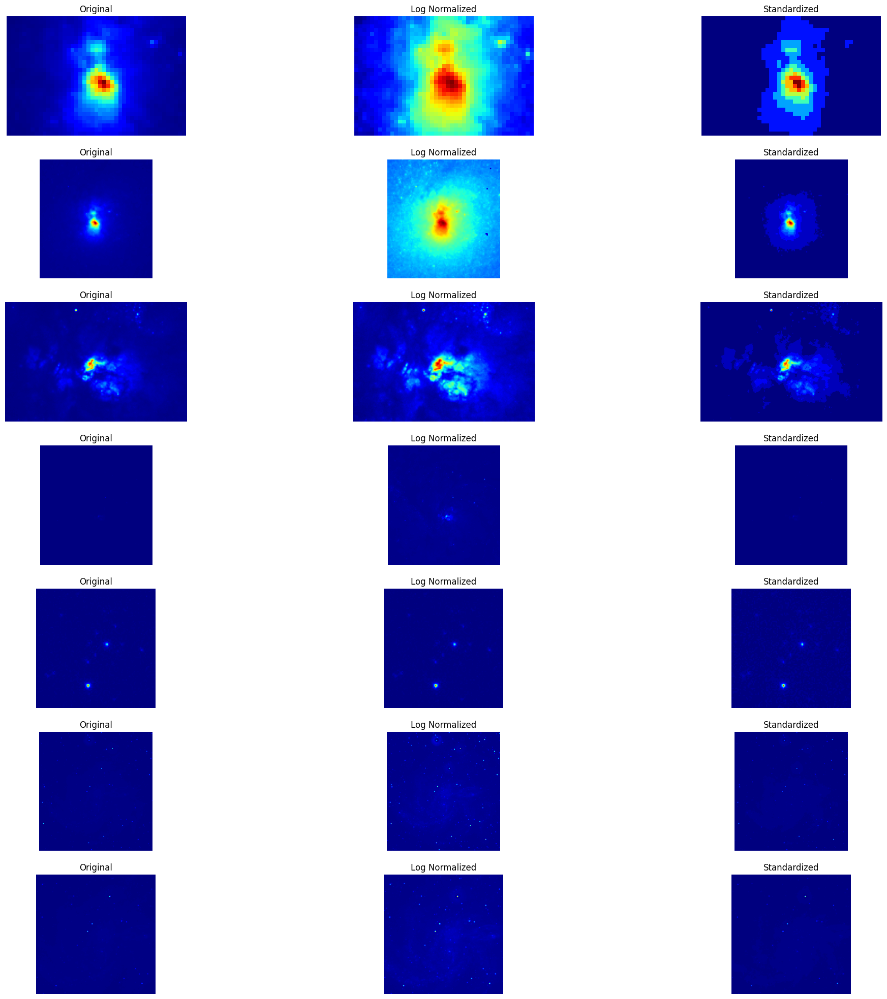

In [27]:
import numpy as np
import matplotlib.pyplot as plt

# List of image variables
images = [NUCLEUS_SCALE_NI, ZOOMED_SCALE_NI, NUCLEUS_SCALE_HST, ZOOMED_SCALE_HST,
          NUCLEUS_SCALE_NEWTON, ZOOMED_SCALE_OM, NUCLEUS_SCALE_OM]

# Function for log normalization
def log_Normalize(img):
    return np.log(img + 1)

# Function for standardization
def Standardization(img):
    lmean = float(np.mean(img))
    lstd = float(np.std(img))
    return np.floor((img - lmean) / lstd)

# Apply log normalization and standardization to images
normalized_images = []
standardized_images = []

for img in images:
    normalized_img = log_Normalize(img)
    standardized_img = Standardization(img)
    normalized_images.append(normalized_img)
    standardized_images.append(standardized_img)

# Plot the original, log normalized, and standardized images
fig, axes = plt.subplots(7, 3, figsize=(25, 25))

for i in range(len(images)):
    axes[i, 0].imshow(images[i], cmap='jet')
    axes[i, 0].set_title('Original')

    axes[i, 1].imshow(normalized_images[i], cmap='jet')
    axes[i, 1].set_title('Log Normalized')

    axes[i, 2].imshow(standardized_images[i], cmap='jet')
    axes[i, 2].set_title('Standardized')

    for j in range(3):
        axes[i, j].axis('off')

# plt.tight_layout()
plt.show()


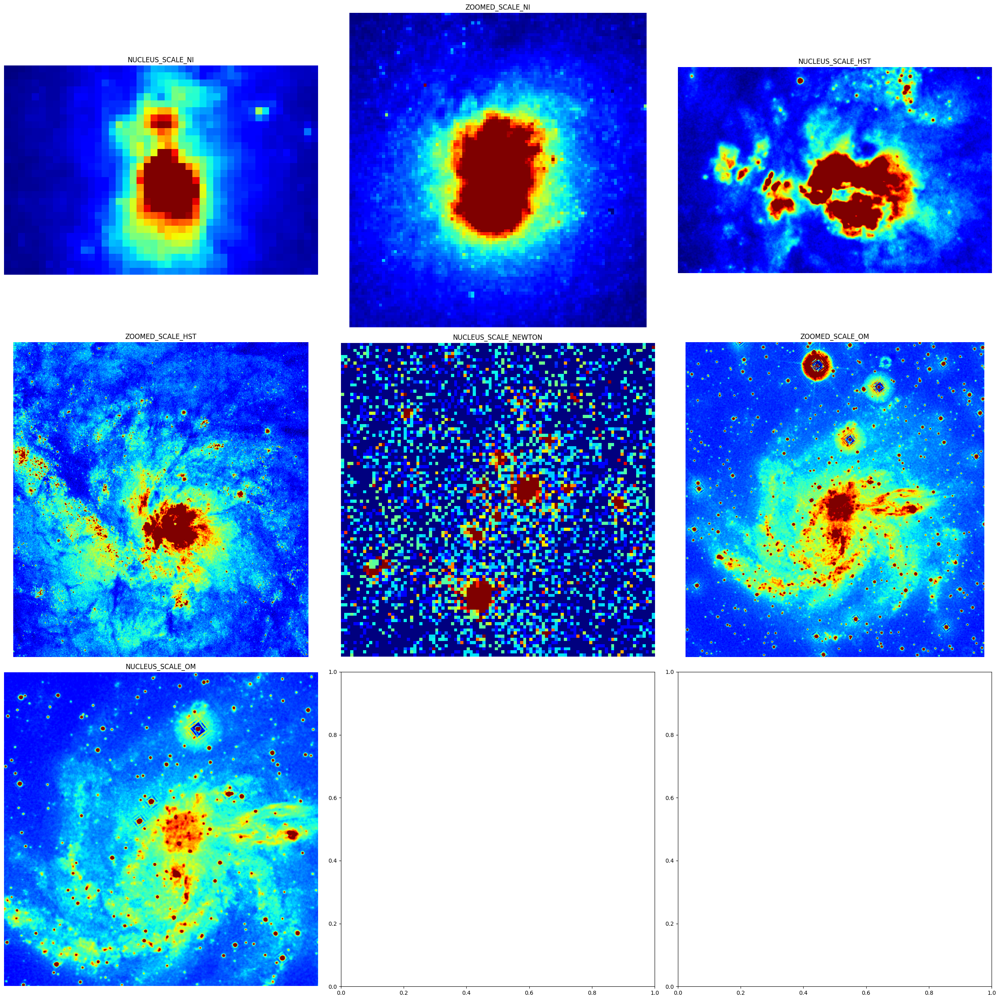

In [28]:
from astropy.visualization import ZScaleInterval
import matplotlib.pyplot as plt

images = [NUCLEUS_SCALE_NI, ZOOMED_SCALE_NI, NUCLEUS_SCALE_HST, ZOOMED_SCALE_HST,
          NUCLEUS_SCALE_NEWTON, ZOOMED_SCALE_OM, NUCLEUS_SCALE_OM]
names = ["NUCLEUS_SCALE_NI", "ZOOMED_SCALE_NI", "NUCLEUS_SCALE_HST", "ZOOMED_SCALE_HST",  "NUCLEUS_SCALE_NEWTON", "ZOOMED_SCALE_OM", "NUCLEUS_SCALE_OM"]
fig, axes = plt.subplots(3, 3, figsize=(25, 25))

for i in range(len(images)):
    img = images[i]
    z = ZScaleInterval()
    z1, z2 = z.get_limits(img)
    row = i // 3
    col = i % 3
    axes[row, col].imshow(img, cmap='jet', vmin=z1, vmax=z2)
    axes[row, col].set_title(names[i])
    axes[row, col].axis('off')

plt.tight_layout()
plt.show()


In [29]:

# Write your inference here
# Write conclusion

# Summary:

1. **Sato Filter:**   
The Sato() filter is a data science tool used to enhance image features, particularly tubular structures and edges. By applying this filter to the images, we obtained visually appealing results, effectively enhancing the desired features such as tubular structures and edges. The Sato filter performed well in most of the images, providing valuable insights.

2. **Meijering (ridges==False) Filter:**   
The Meijering() filter, when used with ridges set to False, combines vessel enhancement and ridge detection techniques. This filter is effective in detecting and analyzing tubular structures with prominent ridges in images. By applying this filter, we were able to identify and analyze tubular structures with ridges, contributing to our understanding of the intricate features within the images.

3. **Meijering() Filter:**   
The Meijering() filter is a data science tool used to highlight vessel-like structures in images. This filter is particularly useful for tasks such as blood vessel segmentation and analysis. We applied the Meijering filter to the images, and it performed well, highlighting vessel-like structures and enabling us to analyze features related to blood vessels and other similar structures. Notably, when applied to the NUCLEUS_SCALE_OM image, the filter revealed star formation regions, and on the NUCLUES_SCALE_NEWTON image, it indicated the presence of a black hole through sharp transition colors in the nucleus.

4. **Roberts_neg_diag() Filter:**     
      The Roberts_neg_diag() filter is specifically designed for edge detection in images, focusing on diagonal edges in a negative direction. However, in our analysis, this filter did not provide meaningful insights or detect significant features in the images.

5. **Image Enhancement:**  
 As part of our analysis, we utilized techniques such as log_normalize function and Gaussian filter to enhance the images. Additionally, the application of ZScaleInterval allowed for improved visualization and clarity, particularly in revealing the spiral arms of the galaxy.

**_Results:_** The Meijering and Meijering with ridges filters produced similar outputs, highlighting tubular structures and providing insights into the images when visualized with hot and jet color maps. The Prism and flag color maps provided information on the layerwise intensity of the nucleus. Overall, our research utilizing these filters and image enhancement techniques provided valuable insights into NGC 6946, the Firework Galaxy.

# Write your inference
1.Active Star Formation: The presence of well-defined spiral arms within NGC 6946 suggests that the galaxy is currently undergoing active star formation processes. This aligns with previous studies and reinforces the understanding that NGC 6946 is a dynamic system where new stars are continuously being formed.

2.Meijering Filter and Star Formation: The application of the Meijering filter proved effective in enhancing the visibility of star formation regions within NGC 6946. This filter highlighted intricate details and provided valuable insights into the galaxy's ongoing evolution.

3.Presence of a Black Hole: The analysis of the "Nuclues_Sclae_Newton" image revealed a sharp intensity transition in the nucleus, indicating the presence of a possible black hole. Further investigations and analysis would be necessary to confirm the nature and characteristics of the observed nucleus.

4.Spiral Arms and Gaussian Filter: By employing the Gaussian filter, we observed the presence of spiral arms within NGC 6946. This finding reinforces the visual evidence of ongoing star formation and further contributes to our understanding of the galaxy's structure.

5.Star Formation in Zoomed Image: The "ZOOMED_SCALE_OM" image provided clear evidence of star formation regions within NGC 6946. The presence of these regions supports the notion of active star formation and aligns with the overall understanding of NGC 6946 as a galaxy with ongoing stellar evolution processes.  

# Write your Conclusion
Our research successfully demonstrated the power of data science in unraveling the hidden secrets of NGC 6946, the Firework Galaxy. The application of image analysis techniques allowed us to visualize and understand the complex structures within the galaxy, revealing insights into star formation processes and galactic dynamics. Furthermore, our findings support the existing literature on NGC 6946's ongoing star formation. By leveraging data science tools, we have contributed valuable insights to the understanding of NGC 6946's remarkable characteristics.

# Q7 (5 Points)

Build a small binary Classification architecture using Convolutional Neural Networks.

**Things to add and take care compulsorily:**
1. 3 Convolutional layers with MaxPooling
2. The total trainable parameters should not be more than 1 Million.
3. Input Image size: (224, 224, 3)


In [30]:
# write you answer(code) here

import tensorflow as tf
from tensorflow.keras import layers
from keras.models import Sequential
from keras.layers import Conv2D,MaxPooling2D
from keras.layers import Activation,Dropout,Flatten,Dense

# Define the model
model = Sequential()

# Convolutional layers
model.add(layers.Conv2D(16, (3, 3), padding='valid',activation='relu', input_shape=(224, 224, 3)))    #  first layer
model.add(layers.MaxPooling2D((2, 2),strides=2,padding='valid',))

model.add(layers.Conv2D(32, (3, 3),padding='valid', activation='relu'))                  # Second layer
model.add(layers.MaxPooling2D((2, 2),strides=2,padding='valid'))

model.add(layers.Conv2D(16, (3, 3),padding='valid', activation='relu'))                # third layer
model.add(layers.MaxPooling2D((2, 2),strides=2,padding='valid'))

# Flatten the output from convolutional layers
model.add(layers.Flatten())

# Dense layers
model.add(layers.Dense(80, activation='relu'))
model.add(layers.Dense(1, activation='sigmoid'))

# Print model summary
model.summary()


Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d (Conv2D)             (None, 222, 222, 16)      448       
                                                                 
 max_pooling2d (MaxPooling2D  (None, 111, 111, 16)     0         
 )                                                               
                                                                 
 conv2d_1 (Conv2D)           (None, 109, 109, 32)      4640      
                                                                 
 max_pooling2d_1 (MaxPooling  (None, 54, 54, 32)       0         
 2D)                                                             
                                                                 
 conv2d_2 (Conv2D)           (None, 52, 52, 16)        4624      
                                                                 
 max_pooling2d_2 (MaxPooling  (None, 26, 26, 16)       0

#Q8 (5 Points)

From Q7, explain with the aid of a diagram how in second Convolutional layer the parameters have been calculated?

In [31]:
# Print your explanation here

print("The first Conv2D(16,(3,3)) layer has 16 filters with a kernel size of (3, 3) and applies the ReLU activation function.")
print("Input shape of the image : (224, 224, 3)")
print("Output shape after the first Conv2D layer: (batch_size, 222, 222, 16)")
print("Number of trainable parameters in the first Conv2D layer: 448 (16 filters(depth) * (3 * 3 * 3) + 16 biases)")

print("A MaxPooling2D layer with a pool size of (2, 2) is added after the first Conv2D layer.")
print("Output shape after the first MaxPooling2D layer: (batch_size, 111, 111, 16)")
print("Number of trainable parameters in the first MaxPooling2D layer: 0")
print("--"*60)
print("The second Conv2D(32,(3,3)) layer has 32 filters with a kernel size of (3, 3) and applies the ReLU activation function.")
print("Output shape after the second Conv2D layer: (batch_size, 109, 109, 32)")
print("Number of trainable parameters in the second Conv2D layer: 4640 (32 filters(depth) * (3 * 3 * 16) + 32 biases)")

print("Another MaxPooling2D layer with a pool size of (2, 2) is added after the second Conv2D layer.")
print("Output shape after the second MaxPooling2D layer: (batch_size, 54, 54, 32)")
print("Number of trainable parameters in the second MaxPooling2D layer: 0")

The first Conv2D(16,(3,3)) layer has 16 filters with a kernel size of (3, 3) and applies the ReLU activation function.
Input shape of the image : (224, 224, 3)
Output shape after the first Conv2D layer: (batch_size, 222, 222, 16)
Number of trainable parameters in the first Conv2D layer: 448 (16 filters(depth) * (3 * 3 * 3) + 16 biases)
A MaxPooling2D layer with a pool size of (2, 2) is added after the first Conv2D layer.
Output shape after the first MaxPooling2D layer: (batch_size, 111, 111, 16)
Number of trainable parameters in the first MaxPooling2D layer: 0
------------------------------------------------------------------------------------------------------------------------
The second Conv2D(32,(3,3)) layer has 32 filters with a kernel size of (3, 3) and applies the ReLU activation function.
Output shape after the second Conv2D layer: (batch_size, 109, 109, 32)
Number of trainable parameters in the second Conv2D layer: 4640 (32 filters(depth) * (3 * 3 * 16) + 32 biases)
Another Ma

**Add your image in this markdown cell**        
In case, if you are not sure how to add image in google colab then you can reach out to us and we shall guide you.

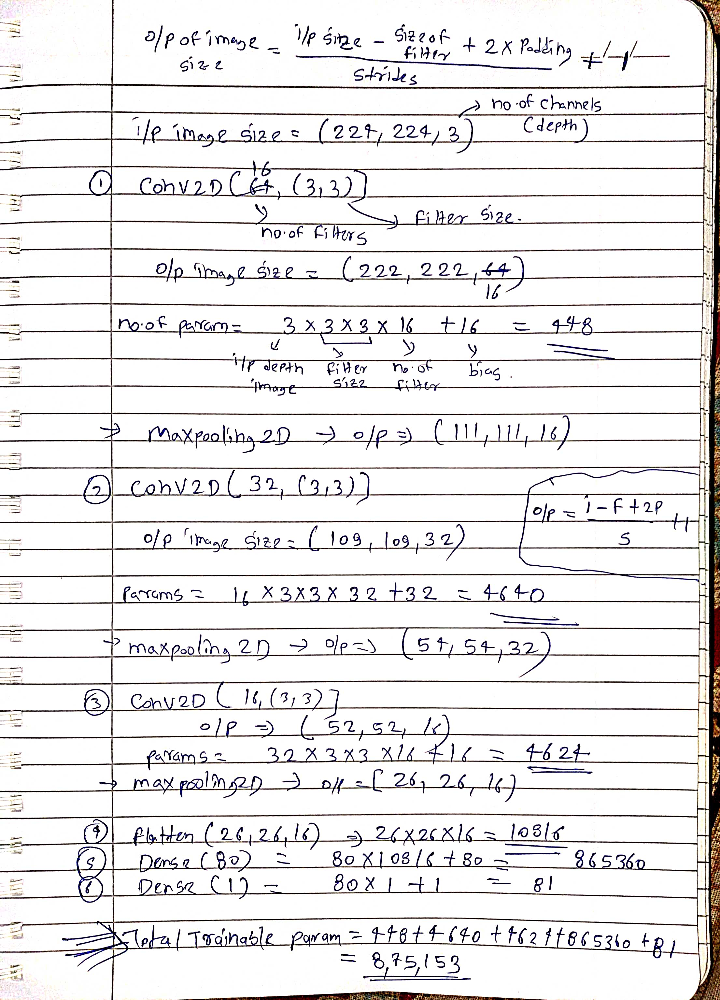

#Q9  (5 Points)

**Which of the two graphs given below is for sigmoid function? Explain the reason for your choice along with the correct formula.**

**Create an array of 100 random numbers between 0 and 1 and apply sigmoid function on it**

*Graph 1:-*     
<img src = "https://drive.google.com/uc?id=1MKeJAiUpPYTDQ0OHar60YmBI7BVpl-9J">

*Graph 2:-*      
<img src = "https://drive.google.com/uc?id=1RYFG5rZ4mO2n52ohWmWTFgehmc30KBqd">

**Answer:** From the above two graphs, **graph 2** represents the sigmoid function.
The formula for the sigmoid function is:  
sigmoid(x) = 1 / (1 + np.exp(-x))  

The sigmoid function is commonly used as an activation function in machine learning and neural networks. It maps any real-valued number `x` to a value between 0 and 1.

Graph 2 exhibits the characteristic S-shape curve that is typical of the sigmoid function. As `x` approaches negative infinity, the sigmoid function approaches 0, and as `x` approaches positive infinity, the sigmoid function approaches 1. This behavior makes it suitable for tasks such as binary classification, where the output is desired to be in the range of 0 to 1  

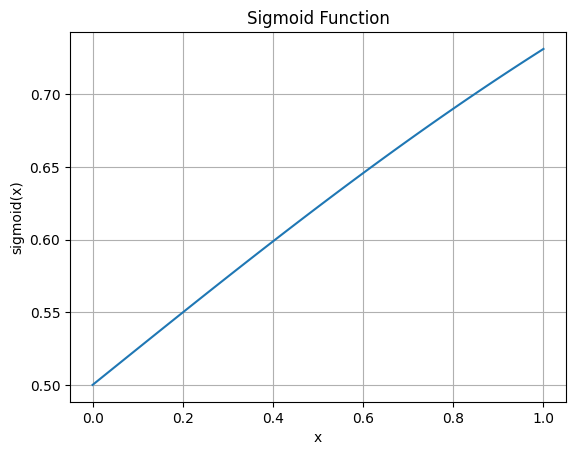

In [32]:
# Write your answer here
import numpy as np
import matplotlib.pyplot as plt

def sigmoid(x):
    return 1 / (1 + np.exp(-x))

# Generate x values
x = np.linspace(0, 1, 100)

# Compute sigmoid function values for each x
y = sigmoid(x)

# Plot the sigmoid function
plt.plot(x,y)
plt.title('Sigmoid Function')
plt.xlabel('x')
plt.ylabel('sigmoid(x)')
plt.grid(True)
plt.show()



# Q 10 (5 Points)

Considering the data we used in Q4 to Q6.

Write an article (at least 200 words) about the minor research you did as part of this assignment. Mentioning

1. About the galaxy you chose

2. Literature survey you performed

3. Hypothesis you wanted to prove using data science and a tool

4. How you proved it

5. Conclusion

6. Your inference



In [33]:
# Write your ans here



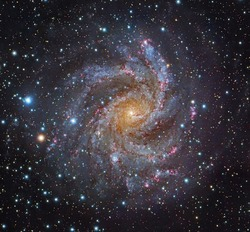

**Introduction:**  
NGC 6946, also known as the Firework Galaxy, is an intriguing spiral galaxy located approximately 22 million light-years away in the constellation Cygnus. Discovered by Sir William Herschel in 1798, this galaxy has captivated astronomers with its remarkable characteristics. In this research study, we embarked on a journey to uncover the hidden secrets of NGC 6946 by leveraging data science tools and techniques.

**Literature Survey:**  
A comprehensive literature survey revealed that NGC 6946 has been extensively studied due to its unique properties. It exhibits ongoing star formation, making it an ideal candidate for investigating stellar evolution. Researchers have also focused on studying its supernova activity, leading to the discovery of a significant number of supernova events within its spiral arms. Previous research has explored various aspects of NGC 6946's dynamics, star formation processes, and supernova occurrences.

**Hypothesis:**  
Our hypothesis was centered around identifying and visualizing the structures within NGC 6946's spiral arms to observe star formation and the presence of a black hole using data science tools. We aimed to employ image analysis techniques and filters to enhance the clarity of the images, allowing us to observe detailed features and potential star formation regions, as well as the black hole present in the galaxy.

**How You Proved It:**  
To prove our hypothesis, we acquired a collection of FITS files containing images of NGC 6946. Using the Astropy library and data science tools, we opened and analyzed the FITS files. We applied logarithmic normalization and standardization functions to enhance the visibility of spiral arms, intricate structures, and potential black holes within the galaxy. By employing Skimage filters such as Sato, Meijering, and Gaussian, we enhanced the images and visualized different features of NGC 6946.

**Conclusion:**  
Our research, utilizing data science tools, provided valuable insights into NGC 6946, the Firework Galaxy. The application of image analysis techniques enabled us to visualize the intricate structures within the galaxy's spiral arms and explore potential star formation regions. By leveraging Skimage filters, we highlighted unique features and gained a deeper understanding of NGC 6946's dynamics.

**Inference:**  
NGC 6946, the Firework Galaxy, is actively undergoing star formation processes. This inference is supported by the presence of star-forming regions prominently captured in the OM Fits images. The well-defined spiral arms observed within NGC 6946 further reinforce the notion of ongoing star formation and align with previous studies on the galaxy's evolutionary processes. The application of Skimage filters, particularly the Meijering filter, proved instrumental in enhancing the visibility of star formation regions within NGC 6946. This filter effectively highlighted the intricate details and provided valuable insights into the galaxy's evolution and dynamic nature. Additionally, the presence of a black hole was also observed.

# ***Happy Coding ! Happy analysis !! Happiest results!!!***